<a href="https://colab.research.google.com/github/Markfesenk0/MLHC-Project/blob/main/MLHC_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Student Details

|        |             Full Name |             Id |             Email |
|---------|-------------------|----------------|------------------ |
|Student 1|   Mark Fesenko|  321208605|  markfesenko@mail.tau.ac.il|
|Student 2|   Lior Zlotorinsky|  312527302|  zlotorinsky1@mail.tau.ac.il|

#Setting and Constants

In [75]:
# @title Setting

%%capture

!pip install shap
!pip install shap xgboost imbalanced-learn
!pip install dcor

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import os
import pickle
import shap
from google.colab import auth
from google.cloud import bigquery
from google.colab import data_table
from google.colab.data_table import DataTable
from scipy import stats
from datetime import timedelta
from xgboost.sklearn import XGBClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.base import BaseEstimator, TransformerMixin, clone
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.compose import ColumnTransformer
from sklearn.metrics import precision_score, roc_curve, accuracy_score, brier_score_loss, precision_recall_curve, roc_auc_score, average_precision_score
from sklearn.calibration import calibration_curve, CalibratedClassifierCV
from sklearn.inspection import permutation_importance
from sklearn.feature_selection import mutual_info_regression
from imblearn.pipeline import Pipeline
from dcor import distance_correlation


DataTable.max_columns = 200
project = 'mimic3-383317' #'mimic-iii-i'
client = bigquery.Client(project=project)
data_table.enable_dataframe_formatter()
auth.authenticate_user()

In [2]:
# @title Constants

min_target_onset = 48       # minimal time of target since admission (hours)
pred_gap = 6                # minimal gap between prediction and target (hours)
pred_window = 42            # duration of prediction window, use only data collected in the first 42 hours for prediction
min_los = 48                # only patients with at least >= 48 hours of hospitalization data
mortality_window = 30       # mortality during or after hospitalization <= 30 days
prolonged_stay = 7          # prolonged stay > 7 days
hospital_readmission = 30   # hospital readmission in <= 30 days after discharge (not to be confused with ICU readmission within the same hospital admission)

#Data Extraction and Target Definition

In [3]:
# @title Download files
# download additional files neede for the project

!gdown 1QBKgf3B_bOthZmMPu2NSDplo7DlcQ3Lo
!unzip -o project_addons.zip

plots_directory = './figures'
os.makedirs(plots_directory, exist_ok=True)

Downloading...
From: https://drive.google.com/uc?id=1QBKgf3B_bOthZmMPu2NSDplo7DlcQ3Lo
To: /content/project_addons.zip
100% 89.0k/89.0k [00:00<00:00, 2.86MB/s]
Archive:  project_addons.zip
  inflating: test_example.csv        
  inflating: vital_metadata.csv      
  inflating: initial_cohort.csv      
  inflating: labs_metadata.csv       


In [4]:
# @title Get Hospitalizations

def get_hosps(subject_ids, client):
  # Query DB - Patients
  hospquery = \
  """
  SELECT admissions.subject_id, admissions.hadm_id
  , admissions.admittime, admissions.dischtime
  , admissions.ethnicity, admissions.deathtime
  , admissions.admission_type, admissions.insurance
  , patients.gender, patients.dob, patients.dod
  FROM `physionet-data.mimiciii_clinical.admissions` admissions
  INNER JOIN `physionet-data.mimiciii_clinical.patients` patients
      ON admissions.subject_id = patients.subject_id
  WHERE admissions.has_chartevents_data = 1
  ORDER BY admissions.subject_id, admissions.hadm_id, admissions.admittime;
  """

  hosps = client.query(hospquery).result().to_dataframe().rename(str.lower, axis='columns')

  hosps = hosps.merge(subject_ids, on='subject_id', how='inner')

  hosps = hosps.sort_values(['subject_id', 'admittime'])
  return hosps

In [5]:
# @title Feature Extraction

def feature_extraction(hosps):
  # Generate feature columns for los, age and mortality
  def age(admittime, dob):
    if admittime < dob:
      return 0
    return admittime.year - dob.year - ((admittime.month, admittime.day) < (dob.month, dob.day))

  hosps['age'] = hosps.apply(lambda row: age(row['admittime'], row['dob']), axis=1)
  hosps['los_hosp_hr'] = (hosps.dischtime - hosps.admittime).astype('timedelta64[h]')
  hosps['mort'] = np.where(~np.isnat(hosps.dod),1,0)

  # Ethnicity - one hot encoding
  hosps.ethnicity = hosps.ethnicity.str.lower()
  hosps.loc[(hosps.ethnicity.str.contains('^white')),'ethnicity'] = 'white'
  hosps.loc[(hosps.ethnicity.str.contains('^black')),'ethnicity'] = 'black'
  hosps.loc[(hosps.ethnicity.str.contains('^hisp')) | (hosps.ethnicity.str.contains('^latin')),'ethnicity'] = 'hispanic'
  hosps.loc[(hosps.ethnicity.str.contains('^asia')),'ethnicity'] = 'asian'
  hosps.loc[~(hosps.ethnicity.str.contains('|'.join(['white', 'black', 'hispanic', 'asian']))),'ethnicity'] = 'other'
  hosps = pd.concat([hosps, pd.get_dummies(hosps['ethnicity'], prefix='eth')], axis = 1)

  # Gender to binary
  hosps['gender'] = np.where(hosps['gender']=="M", 1, 0)

  # admission type and insurance - one hot encoding
  df_cat = hosps[['admission_type', 'insurance']].copy()
  df_num = hosps.drop(['admission_type', 'insurance'], axis = 1)
  df_cat = pd.get_dummies(df_cat, drop_first=True)
  hosps = pd.concat([df_num, df_cat], axis = 1)

  return hosps

In [6]:
# @title Target Labels
def generate_target_labels(hosps):
  labels = ['mortality_label', 'prolonged_stay_label', 'readmit_label']

  hosps['mortality_label'] = np.zeros(hosps.shape[0])
  hosps['prolonged_stay_label'] = np.zeros(hosps.shape[0])

  # mortality label - during hospitalization or up to 30 days after discharge
  days_until_death = (hosps['dod'] - hosps['dischtime'].dt.floor('D')).dt.days
  hosps['mortality_label'] = (days_until_death <= mortality_window).astype(int)

  # prolonged stay label - length of stay > 7 days
  hosps['prolonged_stay_label'] = (hosps['los_hosp_hr'] > prolonged_stay * 24).astype(int)

  # readmit label - in 30 days after discharge (not to be confused with ICU readmission within the same hospital admission)
  hosps = hosps.sort_values(by=['subject_id', 'admittime'])
  hosps['next_admittime'] = hosps.groupby('subject_id')['admittime'].shift(-1)
  hosps['time_to_next_admit'] = hosps['next_admittime'] - hosps['dischtime']
  hosps['readmit_label'] = (hosps['time_to_next_admit'] <= timedelta(days=hospital_readmission)).astype(int)
  hosps = hosps.drop(['next_admittime', 'time_to_next_admit'], axis=1)

  return hosps

In [7]:
# @title Patient Exclusion Criteria
def apply_exclusion(hosps):
  # include only first admissions
  hosps = hosps.sort_values('admittime').groupby('subject_id').first()

  # only patients who admitted for at least 48 hours
  hosps = hosps.loc[hosps['los_hosp_hr'] >= min_los]

  # exclude patients who died before admission
  hosps = hosps.loc[(hosps['mort'] == 0) | (hosps['dod'] - hosps['admittime'].dt.floor('d') >= timedelta(days=0))].reset_index()
  return hosps

##Get Additional Data

In [8]:
# @title Lab data
def get_lab_data(hosps):
  labquery = \
  """--sql
    SELECT labevents.subject_id ,labevents.hadm_id ,labevents.charttime
    , labevents.itemid, labevents.valuenum
    FROM `physionet-data.mimiciii_clinical.labevents` labevents
      INNER JOIN `physionet-data.mimiciii_clinical.admissions` admissions
      ON labevents.subject_id = admissions.subject_id
      AND labevents.hadm_id = admissions.hadm_id
      AND labevents.charttime >= (admissions.admittime)
      AND labevents.charttime <= DATE_ADD(admissions.admittime, INTERVAL 42 HOUR)
      AND itemid in UNNEST(@itemids)
  """

  lavbevent_meatdata = pd.read_csv('labs_metadata.csv')
  job_config = bigquery.QueryJobConfig(
      query_parameters=[
          bigquery.ArrayQueryParameter("itemids", "INTEGER", lavbevent_meatdata['itemid'].tolist()),
      ]
  )

  labs = client.query(labquery, job_config=job_config).result().to_dataframe().rename(str.lower, axis='columns')

  # filter invalid measurmnets
  labs = labs[labs['hadm_id'].isin(hosps['hadm_id'])]
  labs = pd.merge(labs, lavbevent_meatdata, on='itemid')
  labs = labs[labs['valuenum'].between(labs['min'], labs['max'], inclusive='both')]

  return labs

In [9]:
# @title Vitals data
def get_vitals_data(hosps):
  vitquery = \
  """--sql
  -- Vital signs include heart rate, blood pressure, respiration rate, and temperature

    SELECT chartevents.subject_id ,chartevents.hadm_id ,chartevents.charttime
    , chartevents.itemid, chartevents.valuenum
    FROM `physionet-data.mimiciii_clinical.chartevents` chartevents
    INNER JOIN `physionet-data.mimiciii_clinical.admissions` admissions
    ON chartevents.subject_id = admissions.subject_id
    AND chartevents.hadm_id = admissions.hadm_id
    AND chartevents.charttime >= (admissions.admittime)
    AND chartevents.charttime <= DATE_ADD(admissions.admittime, INTERVAL 42 HOUR)
    AND itemid in UNNEST(@itemids)
    -- exclude rows marked as error
    AND chartevents.error IS DISTINCT FROM 1
  """

  vital_meatdata = pd.read_csv('vital_metadata.csv')
  job_config = bigquery.QueryJobConfig(
      query_parameters=[
          bigquery.ArrayQueryParameter("itemids", "INTEGER", vital_meatdata['itemid'].tolist()),
      ]
  )

  vits = client.query(vitquery, job_config=job_config).result().to_dataframe().rename(str.lower, axis='columns')

  # filter invalid measurmnets
  vits = vits[vits['hadm_id'].isin(hosps['hadm_id'])]
  vits = pd.merge(vits, vital_meatdata, on='itemid')
  vits = vits[vits['valuenum'].between(vits['min'], vits['max'], inclusive='both')]

  # convert units from F to C
  vits.loc[(vits['feature name'] == 'TempF'),'valuenum'] = (vits[vits['feature name'] == 'TempF']['valuenum']-32)/1.8
  vits.loc[vits['feature name'] == 'TempF','feature name'] = 'TempC'

  return vits

In [10]:
# @title SOFA and SAPSII features (Mimic Derived)
def get_sofa_data():
  sofa_query = \
  """--sql
      SELECT sofa.subject_id, sofa.hadm_id, sofa.sofa, sofa.icustay_id
      FROM `physionet-data.mimiciii_derived.sofa` sofa
          INNER JOIN `physionet-data.mimiciii_clinical.admissions` admissions
          ON sofa.subject_id = admissions.subject_id
          AND sofa.hadm_id = admissions.hadm_id
  """
  sofa = client.query(sofa_query).result().to_dataframe().rename(str.lower, axis='columns')

  # only keep first icustay data
  sofa.sort_values(by=['subject_id', 'hadm_id', 'icustay_id'], inplace=True)
  sofa.reset_index(drop=True, inplace=True)
  sofa = sofa.drop_duplicates(subset=['subject_id', 'hadm_id'], keep='first')
  sofa = sofa.drop('icustay_id', axis=1)

  return sofa

def get_sapsii_data():
  sapsii_query = \
  """--sql
      SELECT sapsii.subject_id, sapsii.hadm_id, sapsii.sapsii, sapsii.icustay_id
      FROM `physionet-data.mimiciii_derived.sapsii` sapsii
      INNER JOIN `physionet-data.mimiciii_clinical.admissions` admissions
          ON sapsii.subject_id = admissions.subject_id
          AND sapsii.hadm_id = admissions.hadm_id
  """
  sapsii = client.query(sapsii_query).result().to_dataframe().rename(str.lower, axis='columns')

  # only keep first icustay data
  sapsii.sort_values(by=['subject_id', 'hadm_id', 'icustay_id'], inplace=True)
  sapsii.reset_index(drop=True, inplace=True)
  sapsii = sapsii.drop_duplicates(subset=['subject_id', 'hadm_id'], keep='first')
  sapsii = sapsii.drop('icustay_id', axis=1)

  return sapsii

In [11]:
# @title Medication Features
# create a boolean matrix of patients who were given any of the medications below
def get_medication_data(hosps):
  medication_categories = {
      "vasopressors": ['Norepinephrine', 'Epinephrine', 'Vasopressin'],
      "sedatives": ['Propofol', 'Midazolam', 'Fentanyl'],
      "antibiotics": ['Amoxicillin', 'Vancomycin', 'Piperacillin'],
      "antiarrhythmics": ['Bretylium', 'Amiodarone', 'Lidocaine'],
      "anticoagulants": ['Heparin', 'Warfarin'],
      "inotropes": ['Dopamine', 'Dobutamine', 'Milrinone']
  }

  columns = list(medication_categories.keys())
  medications_df = pd.DataFrame(columns=['subject_id'] + columns)
  medications_df['subject_id'] = hosps['subject_id'].unique()
  medications_df.fillna(0, inplace=True)

  medication_to_itemid = {}

  # Populate the medication_to_itemid dictionary
  for category, medications in medication_categories.items():
   for medication in medications:
        query = f"""
            SELECT itemid
            FROM `physionet-data.mimiciii_clinical.d_items`
            WHERE LOWER(label) LIKE '%{medication.lower()}%'
        """
        query_job = client.query(query)
        rows = list(query_job)
        if rows:
          rows = [row.itemid for row in rows]
          rows = list(filter(lambda item: item > 30000, rows))
          medication_to_itemid[medication] = rows

  for category, medications in medication_categories.items():
    for medication in medications:
      itemid = medication_to_itemid.get(medication)
      if itemid is None or len(itemid) == 0:
        continue
      query = f"""
          SELECT DISTINCT subject_id, hadm_id, charttime FROM (
              SELECT inputevents_cv.subject_id, inputevents_cv.hadm_id, inputevents_cv.charttime FROM `physionet-data.mimiciii_clinical.inputevents_cv` inputevents_cv
              JOIN (
                    SELECT subject_id, hadm_id, MIN(admittime) AS first_admittime
                    FROM `physionet-data.mimiciii_clinical.admissions`
                    GROUP BY subject_id, hadm_id
                ) admissions_first
                    ON inputevents_cv.subject_id = admissions_first.subject_id
                    AND inputevents_cv.hadm_id = admissions_first.hadm_id
                    AND inputevents_cv.charttime >= (first_admittime)
                    AND inputevents_cv.charttime <= DATE_ADD(first_admittime, INTERVAL 42 HOUR)
                WHERE itemid IN ({', '.join(map(str, itemid))})
                UNION ALL
                SELECT inputevents_mv.subject_id, inputevents_mv.hadm_id, inputevents_mv.starttime as charttime FROM `physionet-data.mimiciii_clinical.inputevents_mv` inputevents_mv
                JOIN (
                    SELECT subject_id, hadm_id, MIN(admittime) AS first_admittime
                    FROM `physionet-data.mimiciii_clinical.admissions`
                    GROUP BY subject_id, hadm_id
                ) admissions_first
                    ON inputevents_mv.subject_id = admissions_first.subject_id
                    AND inputevents_mv.hadm_id = admissions_first.hadm_id
                    AND inputevents_mv.starttime >= (first_admittime)
                    AND inputevents_mv.starttime <= DATE_ADD(first_admittime, INTERVAL 42 HOUR)
                WHERE itemid IN ({', '.join(map(str, itemid))})
            )
        """
      query_job = client.query(query).result().to_dataframe().rename(str.lower, axis='columns')

      # filter only data relevant to each patients first admission & first 42 hours
      filtered_df = pd.merge(query_job, hosps, on=['subject_id', 'hadm_id'], how='right')
      filtered_df = filtered_df[
          (filtered_df['charttime'] >= filtered_df['admittime']) &
          (filtered_df['charttime'] <= filtered_df['dischtime'])
      ]
      subject_ids = filtered_df['subject_id'].unique()
      mask = medications_df['subject_id'].isin(subject_ids)
      medications_df.loc[mask, category.lower()] = 1

  medications_df = medications_df.sort_values(by='subject_id')
  medications_df.to_csv('medications_df.csv', index=False)

  return medications_df

In [12]:
# @title Procedure Events
def get_procedure_events_data(hosps):
  procedureevents_mv_query = \
  """
  SELECT DISTINCT procedureevents_mv.subject_id, procedureevents_mv.hadm_id, procedureevents_mv.starttime, ordercategoryname
  FROM `physionet-data.mimiciii_clinical.procedureevents_mv` procedureevents_mv
  JOIN `physionet-data.mimiciii_clinical.admissions` admissions
    ON procedureevents_mv.subject_id = admissions.subject_id
    AND procedureevents_mv.starttime >= (admissions.admittime)
    AND procedureevents_mv.starttime <= DATE_ADD(admissions.admittime, INTERVAL 42 HOUR)
  ORDER BY procedureevents_mv.subject_id;
  """
  query_job = client.query(procedureevents_mv_query).result().to_dataframe().rename(str.lower, axis='columns')

  # filter only data relevant to each patients first admission & first 42 hours
  filtered_df = pd.merge(query_job, hosps, on=['subject_id', 'hadm_id'], how='right')
  filtered_df = filtered_df[
      (filtered_df['starttime'] >= filtered_df['admittime']) &
      (filtered_df['starttime'] <= filtered_df['dischtime'])
  ]
  filtered_df = filtered_df[['subject_id', 'ordercategoryname']]

  columns = list(filtered_df['ordercategoryname'].unique())
  columns = list(set(value.lower() for value in columns))
  procedure_events_df = pd.DataFrame(columns=['subject_id'] + columns)
  procedure_events_df['subject_id'] = hosps['subject_id'].unique()
  procedure_events_df.fillna(0, inplace=True)

  for category in columns:
    subject_ids = filtered_df.loc[filtered_df['ordercategoryname'].str.lower() == category, 'subject_id'].tolist()
    mask = procedure_events_df['subject_id'].isin(subject_ids)
    procedure_events_df.loc[mask, category.lower()] = 1

  procedure_events_df = procedure_events_df.sort_values(by='subject_id')
  procedure_events_df.to_csv('procedure_events_df.csv', index=False)

  return procedure_events_df

In [13]:
# @title Merge All Data With Hospitalizations

def get_additional_data(hosps):
  labs = get_lab_data(hosps)
  vits = get_vitals_data(hosps)
  sofa = get_sofa_data()
  sapsii = get_sapsii_data()
  medications_df = get_medication_data(hosps)
  procedure_events_df = get_procedure_events_data(hosps)

  merged_df = hosps.merge(procedure_events_df, how='left', on=['subject_id'])
  merged_df = merged_df.merge(medications_df, how='left', on=['subject_id'])

  vits['category'] = 'vits'
  vits_and_labs_df = pd.concat([vits, labs])

  vits_and_labs_df['feature name'] = vits_and_labs_df['feature name'].str.lower()
  grouped = vits_and_labs_df.groupby(['hadm_id', 'feature name'])           # group by 'hadm_id', 'feature_name'
  aggregated = grouped['valuenum'].agg(missing=lambda x: x.isna().any(), mean='mean', max='max', min='min')       # any, mean, max, and min for each group
  pivoted = aggregated.pivot_table(index=['hadm_id'], columns='feature name', values=['missing', 'mean', 'max', 'min']) # reshape
  pivoted.columns = ['_'.join(col).rstrip('_') for col in pivoted.columns]  # change names to min_feature, max_feature...
  pivoted.reset_index(inplace=True)
  merged_df = merged_df.merge(pivoted, how='left', on=['hadm_id'])

  # fix weight column
  weights = vits.loc[vits['feature name'] == 'Weight'].groupby(['subject_id'])['valuenum'].agg(['first'])
  weights.rename(columns={'first': 'weight'}, inplace=True)
  weights.reset_index(inplace=True)
  weights.rename(columns={'index': 'subject_id'}, inplace=True)
  merged_df = merged_df.drop(['min_weight', 'max_weight', 'mean_weight'], axis=1)
  merged_df = merged_df.merge(weights, how='left', on='subject_id')

  # add sofa and sapsii
  merged_df = merged_df.merge(sofa, how='left', on=['subject_id', 'hadm_id'])
  merged_df = merged_df.merge(sapsii, how='left', on=['subject_id', 'hadm_id'])

  # replace nan values with 1 in missing cloumns and convert int
  missing_cols = [col for col in merged_df.columns if col.startswith('missing_')]
  merged_df[missing_cols] = merged_df[missing_cols].fillna(1).astype(int)

  return merged_df

In [14]:
# @title Compound Features
def generate_compound_features(hosps):
  procedure_columns = ['ventilation', 'intubation/extubation', 'significant events', 'communication', 'peripheral lines',
                       'crrt filter change', 'continuous procedures', 'dialysis', 'imaging', 'peritoneal dialysis',
                       'procedures', 'invasive lines']

  medication_columns = ['vasopressors', 'sedatives', 'antibiotics', 'antiarrhythmics', 'anticoagulants', 'inotropes']

  hosps_copy = hosps.copy()
  hosps_copy['n_procedures'] = hosps_copy[procedure_columns].sum(axis=1)
  hosps_copy['n_medications'] = hosps_copy[medication_columns].sum(axis=1)

  return hosps_copy

##Generate Hospitalizations

In [15]:
def generate_hosps(subject_ids, client):
  hosps = get_hosps(subject_ids, client)
  hosps = feature_extraction(hosps)
  hosps = generate_target_labels(hosps)
  hosps = apply_exclusion(hosps)
  hosps = get_additional_data(hosps)
  hosps = generate_compound_features(hosps)

  # drop all columns that might cause data leakage
  columns_to_drop = ['subject_id', 'admittime', 'dischtime', 'ethnicity', 'dob', 'dod', 'deathtime', 'mort', 'hadm_id', 'los_hosp_hr']
  return hosps.drop(columns_to_drop, axis=1)

init_cohort = pd.read_csv('initial_cohort.csv')
hosps = generate_hosps(init_cohort, client)
hosps.head()

,gender,age,eth_asian,eth_black,eth_hispanic,eth_other,eth_white,admission_type_EMERGENCY,admission_type_NEWBORN,admission_type_URGENT,...,missing_spo2,missing_sysbp,missing_tempc,missing_wbc,missing_weight,weight,sofa,sapsii,n_procedures,n_medications
0,1,0,1,0,0,0,0,0,1,0,...,1,1,1,0,1,NaN,4,22,0,0
1,1,76,0,0,0,0,1,1,0,0,...,0,0,0,0,0,96.800003,7,79,0,4
2,0,47,0,0,0,0,1,1,0,0,...,0,0,0,0,0,53.599998,4,35,0,0
3,1,0,1,0,0,0,0,0,1,0,...,1,1,1,0,1,NaN,0,6,0,0
4,0,0,0,0,0,0,1,0,1,0,...,1,1,1,0,1,NaN,0,13,0,0


##Labels Stats

In [16]:
target_labels = ['mortality_label', 'prolonged_stay_label', 'readmit_label']
mortality_label = target_labels[0]
prolonged_label = target_labels[1]
readmit_label = target_labels[2]

mortality_label_counts = hosps[mortality_label].value_counts()
prolonged_stay_label_counts = hosps[prolonged_label].value_counts()
readmit_label_counts = hosps[readmit_label].value_counts()
print(mortality_label_counts)
print(prolonged_stay_label_counts)
print(readmit_label_counts)

0    26134
1     3292
Name: mortality_label, dtype: int64
1    14799
0    14627
Name: prolonged_stay_label, dtype: int64
0    28262
1     1164
Name: readmit_label, dtype: int64


In [17]:
hosps.groupby([mortality_label, prolonged_label, readmit_label])['gender'].agg(count='count').reset_index().rename(
    columns={mortality_label:'Mortality', prolonged_label:'Prolonged Stay', readmit_label:'Hospital Readmission'})

,Mortality,Prolonged Stay,Hospital Readmission,count
0,0,0,0,12987
1,0,0,1,343
2,0,1,0,12149
3,0,1,1,655
4,1,0,0,1242
5,1,0,1,55
6,1,1,0,1884
7,1,1,1,111


#Data Partition

In [18]:
# @title Data Partition
y = hosps[target_labels]
X = hosps.drop(target_labels, axis=1)
X = X.reindex(sorted(X.columns), axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

#Data Preprocessing

In [19]:
# @title Define numerical and binary features
def define_numerical_and_binary_columns():
  numerical_columns = ['age', 'weight', 'sofa', 'sapsii', 'max_albumin', 'max_anion gap', 'max_bicarbonate', 'max_bilirubin', 'max_bun',
                       'max_chloride', 'max_creatinine', 'max_diasbp', 'max_glucose', 'max_heartrate', 'max_hematocrit', 'max_hemoglobin',
                       'max_inr', 'max_lactate', 'max_magnesium', 'max_meanbp', 'max_phosphate', 'max_platelet', 'max_potassium', 'max_pt',
                       'max_ptt', 'max_resprate', 'max_sodium', 'max_spo2', 'max_sysbp', 'max_tempc', 'max_wbc', 'mean_albumin',
                       'mean_anion gap', 'mean_bicarbonate', 'mean_bilirubin', 'mean_bun', 'mean_chloride', 'mean_creatinine', 'mean_diasbp',
                       'mean_glucose', 'mean_heartrate', 'mean_hematocrit', 'mean_hemoglobin', 'mean_inr', 'mean_lactate',
                       'mean_magnesium', 'mean_meanbp', 'mean_phosphate', 'mean_platelet', 'mean_potassium', 'mean_pt', 'mean_ptt',
                       'mean_resprate', 'mean_sodium', 'mean_spo2', 'mean_sysbp', 'mean_tempc', 'mean_wbc', 'min_albumin',
                       'min_anion gap', 'min_bicarbonate', 'min_bilirubin', 'min_bun', 'min_chloride', 'min_creatinine', 'min_diasbp',
                       'min_glucose', 'min_heartrate', 'min_hematocrit', 'min_hemoglobin', 'min_inr', 'min_lactate', 'min_magnesium',
                       'min_meanbp', 'min_phosphate', 'min_platelet', 'min_potassium', 'min_pt', 'min_ptt', 'min_resprate', 'min_sodium',
                       'min_spo2', 'min_sysbp', 'min_tempc', 'min_wbc', 'n_procedures', 'n_medications']
  binary_columns = [col for col in X.columns if col not in numerical_columns]
  return numerical_columns, binary_columns

numerical_columns, binary_columns = define_numerical_and_binary_columns()

##Features' correlations with targets

In [73]:
# @title Functions
def calculate_correlations(X, y, correlation_type):
  corrs = np.empty(X.shape[1])
  if correlation_type not in ['pearson', 'distance', 'MIC']:
    raise Exception('Error: no valid correlation type was given')
  for i, col in enumerate(X.columns):
    if correlation_type == 'pearson':
      nan_indices = X[col].isna()
      corrs[i] = stats.pearsonr(X[col][~nan_indices], y[~nan_indices])[0]
    elif correlation_type == 'distance':
      nan_indices = X[col].isna()
      corrs[i] = distance_correlation(X[col][~nan_indices].astype(float), y[~nan_indices].astype(float))
    elif correlation_type == 'MIC':
      nan_indices = X[col].isna()
      corrs[i] = mutual_info_regression(X[col][~nan_indices].to_numpy().reshape((-1,1)), y[~nan_indices])
  return corrs

def plot_positives_count_vs_feature(X, y, ax, legend_label, marker_size_scale):
  counts = {}
  for val, label in zip(X, y):
    if pd.isna(val):
      continue
    if val in counts:
      counts[val][label] += 1
    else:
      counts[val] = [0, 1] if label else [1, 0]
  fracs = { key: val[1] / (val[0] + val[1]) for key, val in counts.items() }
  ax.scatter(fracs.keys(), fracs.values(), s=[sum(val) * marker_size_scale for val in counts.values()], label=legend_label)

def get_top_or_bottom_features(corrs, label, top_n_features, is_top):
  return sorted(zip(X.columns, corrs[label]), key=lambda item: np.abs(item[1]), reverse=is_top)[:top_n_features]

def get_top_features(corrs, label, top_n_features):
  return get_top_or_bottom_features(corrs, label, top_n_features, is_top=True)

def get_bottom_features(corrs, label, top_n_features):
  return get_top_or_bottom_features(corrs, label, top_n_features, is_top=False)

def plot_top_or_bottom_features_in_correlation_with_target(X, y, corrs, label, top_n_features, is_top):
  n_cols = 4
  n_rows = int(np.ceil(top_n_features / n_cols))
  fig, axes = plt.subplots(n_rows, n_cols, figsize=(24, 8*n_rows))
  axes = axes.ravel()
  font_size = 13
  top_features = get_top_or_bottom_features(corrs, label, top_n_features, is_top)
  for i, (col, corr) in enumerate(top_features):
    ax = axes[i]
    plot_positives_count_vs_feature(X[col], y[label], ax=ax, legend_label='r=%0.2f' % corr, marker_size_scale=0.05)
    top_or_bottom_str = 'Top' if is_top else 'Bottom'
    ax.set_title(f'{top_or_bottom_str} {i+1} feature in\ncorrelation with {label}', fontsize=font_size)
    ax.set_xlabel(col, fontsize=font_size)
    if (i % n_cols) == 0:
      ax.set_ylabel('positives fraction', fontsize=font_size)
    ax.legend()
  plt.show()

def plot_top_features_in_correlation_with_target(X, y, corrs, label, top_n_features):
  plot_top_or_bottom_features_in_correlation_with_target(X, y, corrs, label, top_n_features, is_top=True)

def plot_bottom_features_in_correlation_with_target(X, y, corrs, label, top_n_features):
  plot_top_or_bottom_features_in_correlation_with_target(X, y, corrs, label, top_n_features, is_top=False)

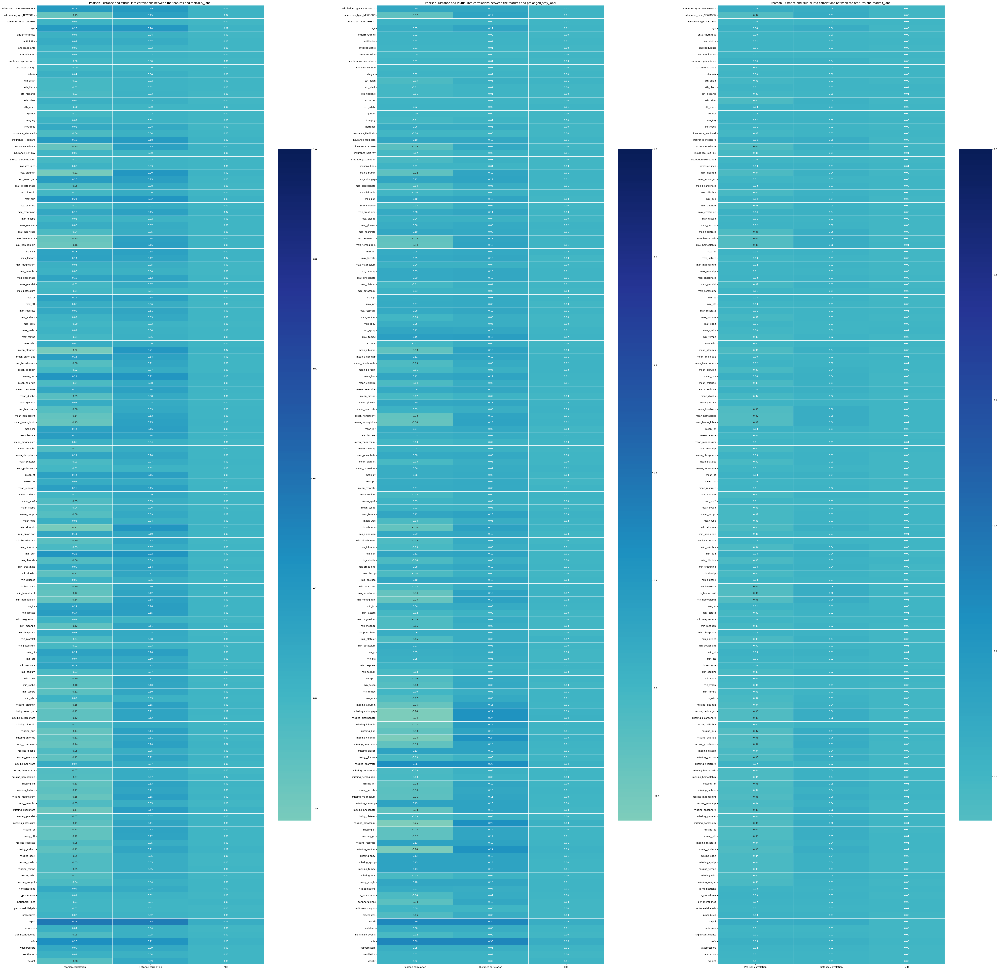

In [74]:
# @title All features' correlations with all targets
figx, axes = plt.subplots(1, 3, figsize=(75, 75))
pearsons = {}
distances = {}
MICs = {}
for i, label in enumerate(target_labels):
  pearsons[label] = calculate_correlations(X_train, y_train[label], 'pearson')
  distances[label] = calculate_correlations(X_train, y_train[label], 'distance')
  MICs[label] = calculate_correlations(X_train, y_train[label], 'MIC')
  sns.heatmap(np.concatenate([[pearsons[label]], [distances[label]], [MICs[label]]]).T, vmax=1.0, center=0, fmt='.2f', cmap="YlGnBu",
              xticklabels=['Pearson correlation', 'Distance correlation', 'MIC'], yticklabels=X_train.columns,
              linewidths=.5, annot=True, cbar_kws={"shrink": .70}, ax=axes[i])
  axes[i].set_title(f'Pearson, Distance and Mutual Info correlations between the features and {label}')
plt.show()

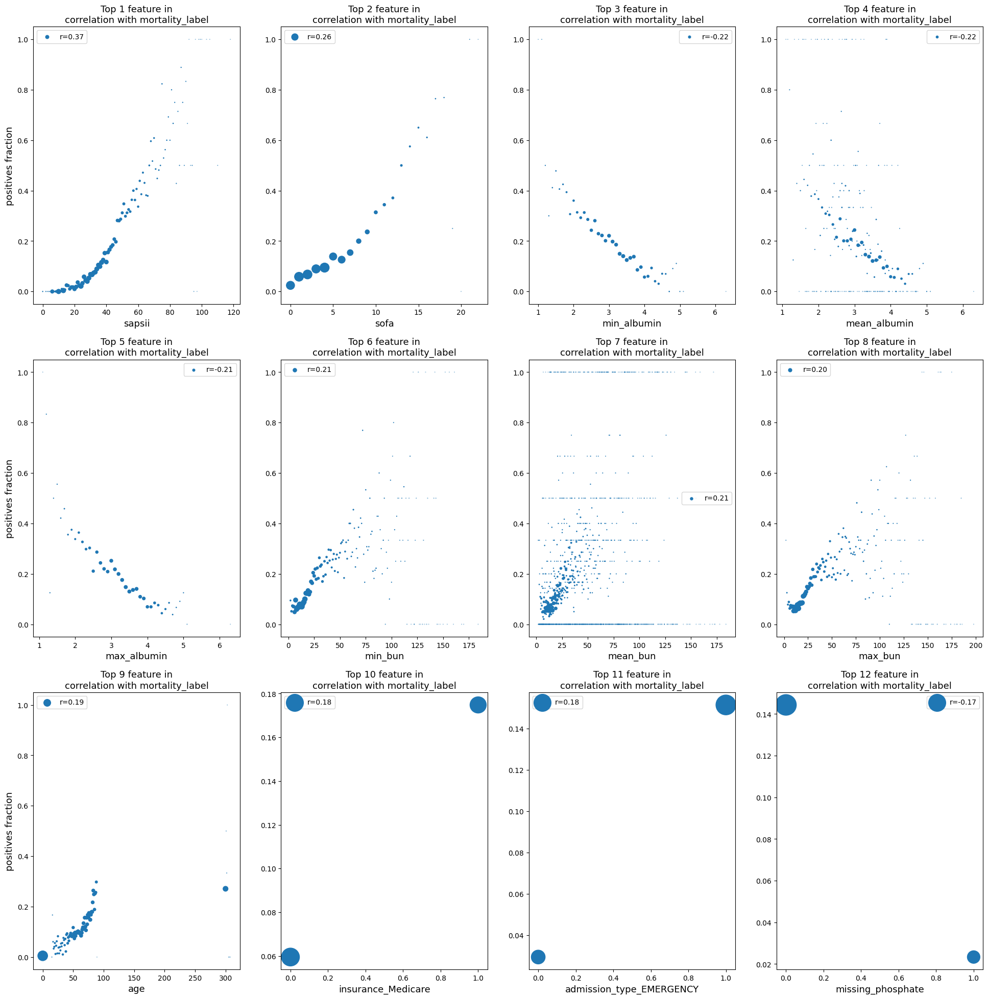

In [ ]:
# @title Top features in (Pearson) correlation with mortality target
plot_top_features_in_correlation_with_target(X_train, y_train, pearsons, mortality_label, 12)

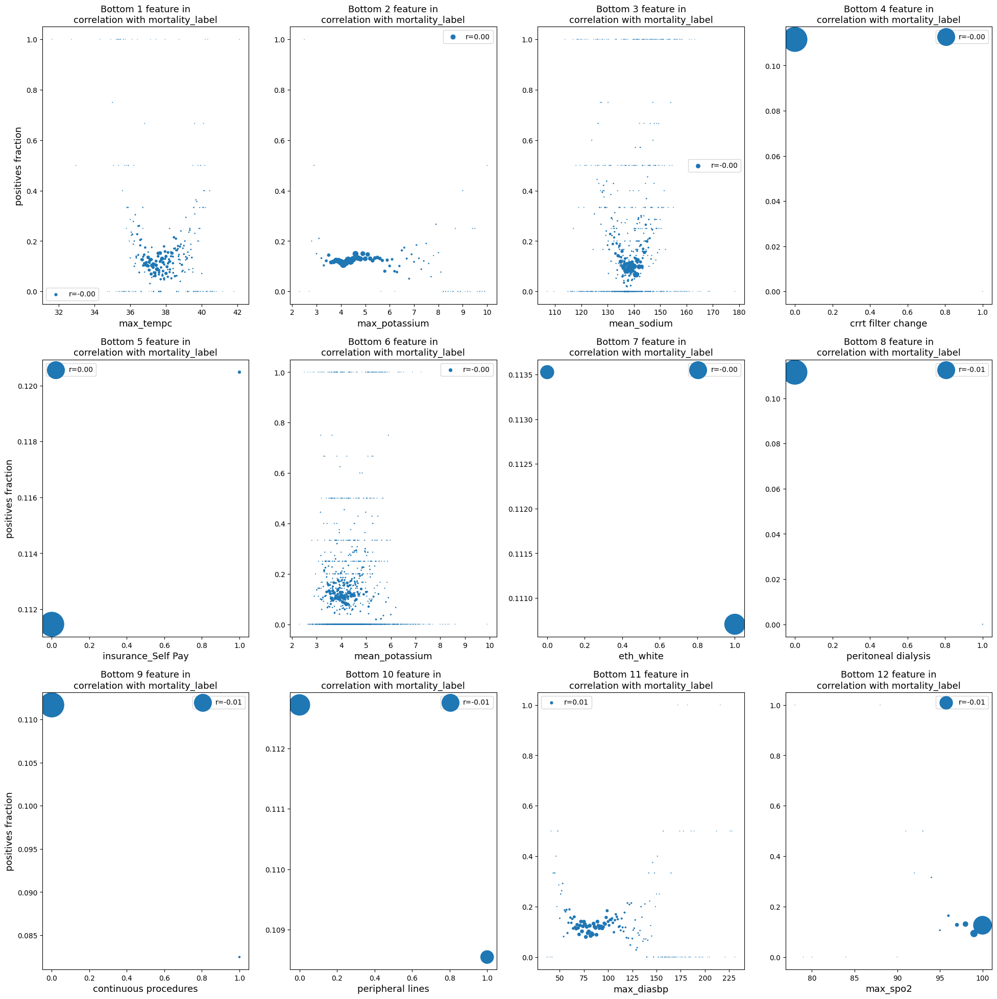

In [ ]:
# @title Bottom features in (Pearson) correlation with mortality target
plot_bottom_features_in_correlation_with_target(X_train, y_train, pearsons, mortality_label, 12)

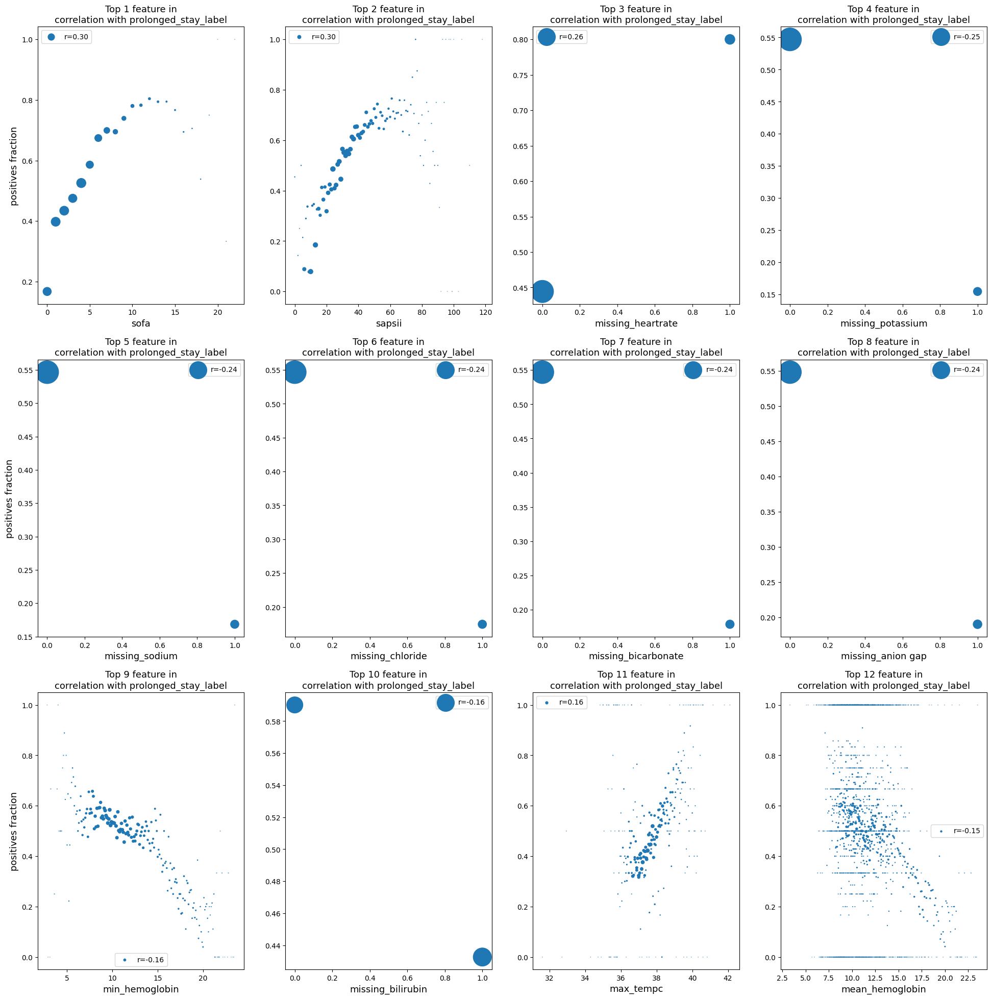

In [ ]:
# @title Top features in (Pearson) correlation with prolonged stay target
plot_top_features_in_correlation_with_target(X_train, y_train, pearsons, prolonged_label, 12)

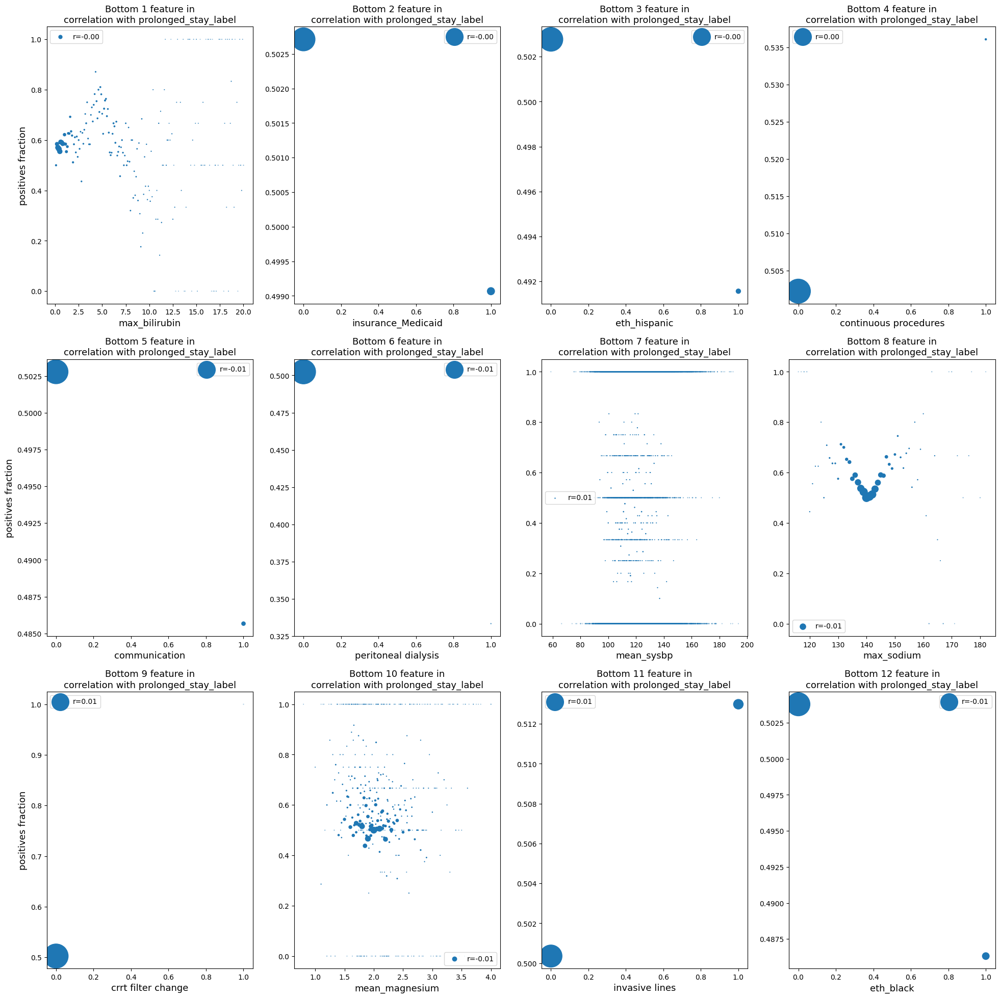

In [ ]:
# @title Bottom features in (Pearson) correlation with prolonged stay target
plot_bottom_features_in_correlation_with_target(X_train, y_train, pearsons, prolonged_label, 12)

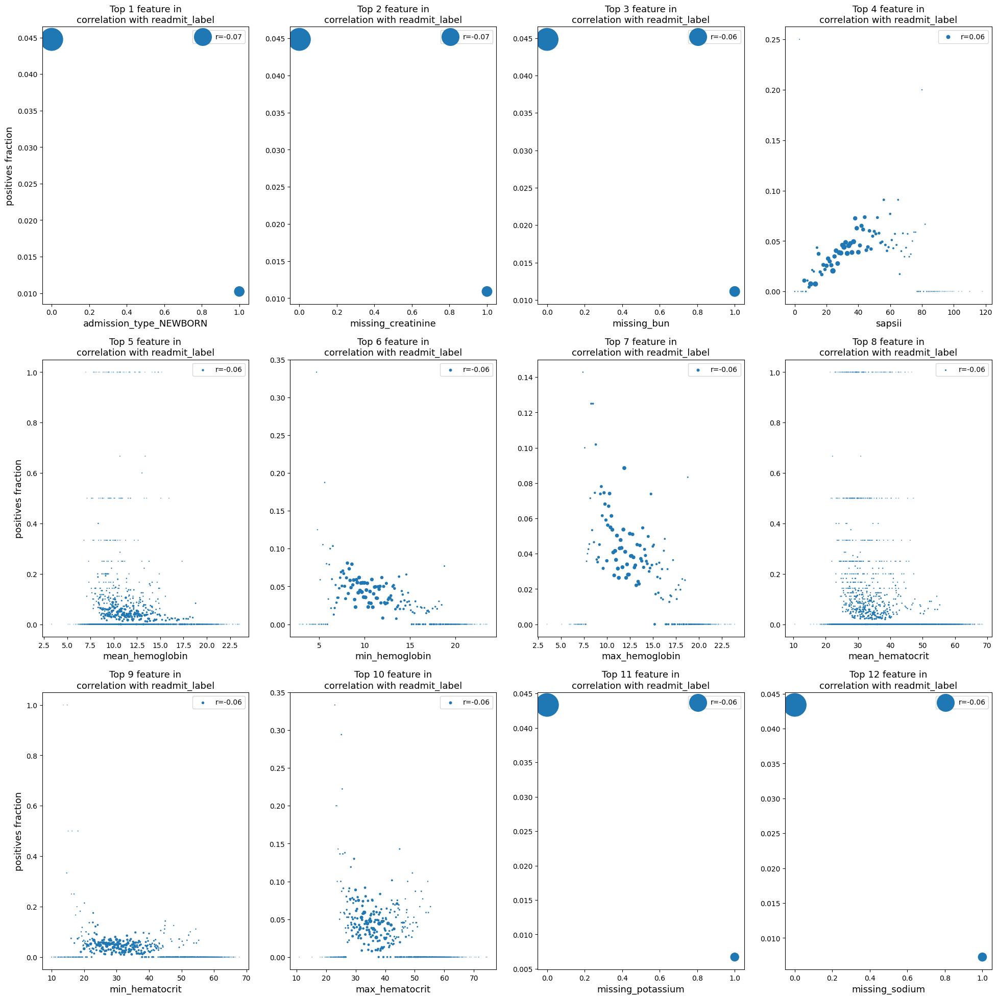

In [ ]:
# @title Top features in (Pearson) correlation with readmission target
plot_top_features_in_correlation_with_target(X_train, y_train, pearsons, readmit_label, 12)

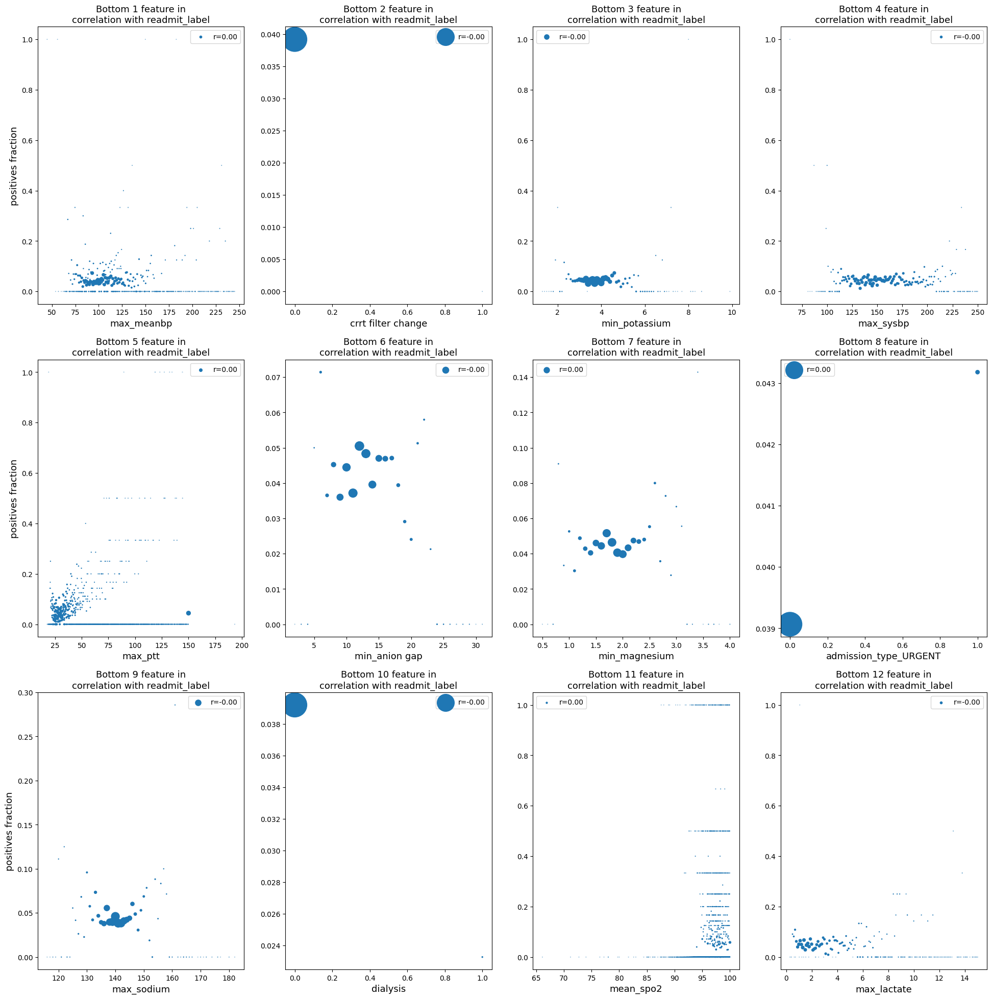

In [ ]:
# @title Bottom features in (Pearson) correlation with readmission target
plot_bottom_features_in_correlation_with_target(X_train, y_train, pearsons, readmit_label, 12)

##Features' correlations with each other

In [ ]:
correlations = X_train.corr()
plt.figure(figsize=(100, 100))
sns.heatmap(correlations, vmax=1.0, center=0, fmt='.2f', cmap="YlGnBu", linewidths=.5, annot=True, cbar_kws={"shrink": .70})
plt.show()

##Pipeline's Manipulations

In [ ]:
# @title DropFeaturesTransformer
def features_with_low_correlation_with_target_to_drop(X_train, y_train, corrs, threshold):
  return [col for col in X_train.columns[np.abs(corrs) < threshold] if col not in ['age', 'gender']]

def features_with_high_correlation_with_each_other_to_drop(X_train, corrs, threshold, cols_to_ignore=[]):
  corrs = corrs.drop(['age', 'gender'], axis=0, inplace=False)
  corrs.drop(['age', 'gender'], axis=1, inplace=True)
  corrs.drop(cols_to_ignore, axis=0, inplace=True)
  corrs.drop(cols_to_ignore, axis=1, inplace=True)

  high_corr_cols = []
  above_threshold = {}
  for i in range(corrs.shape[0]):
    for j in range(i+1, corrs.shape[1]):
      if corrs.iloc[i, j] > threshold:
        if i not in above_threshold:
          above_threshold[i] = set()
        above_threshold[i].add(j)
        if j not in above_threshold:
          above_threshold[j] = set()
        above_threshold[j].add(i)

  while len(above_threshold) > 0:
    min_apps = min(above_threshold.items(), key=lambda item: len(item[1]))
    min_apps_key = min_apps[0]
    min_apps_val = min_apps[1]

    if len(min_apps_val) == 1:
      (key,) = min_apps_val
      del above_threshold[key]
    else:
      for key in min_apps_val:
        if key in above_threshold:
          above_threshold[key].remove(min_apps_key)

    del above_threshold[min_apps_key]
    high_corr_cols.append(corrs.columns[min_apps_key])

  return high_corr_cols

class DropFeaturesTransformer(BaseEstimator, TransformerMixin):
  def __init__(self, X_train, y_train, Xy_corrs=None, Xy_threshold=None, XX_corrs=None, XX_threshold=None):
    self.X_train = X_train
    self.y_train = y_train
    self.Xy_corrs = Xy_corrs
    self.Xy_threshold = Xy_threshold
    self.XX_corrs = XX_corrs
    self.XX_threshold = XX_threshold

    if Xy_corrs is not None:
      X_y_cols_to_drop = features_with_low_correlation_with_target_to_drop(X_train, y_train, Xy_corrs, Xy_threshold)
    else:
      X_y_cols_to_drop = []

    if XX_corrs is not None:
      X_X_cols_to_drop = features_with_high_correlation_with_each_other_to_drop(X_train, XX_corrs, XX_threshold, cols_to_ignore=X_y_cols_to_drop)
    else:
      X_X_cols_to_drop = []
    self.cols_to_drop = np.union1d(X_y_cols_to_drop, X_X_cols_to_drop)

  def fit(self, X, y=None):
    return self

  def transform(self, X, y=None):
    return X.drop(self.cols_to_drop, axis=1, inplace=False)

In [ ]:
# @title AgeGenderImputer
class AgeGenderImputer(BaseEstimator, TransformerMixin):
    def __init__(self): # If needed, you can add parameters to this function
      self.imputers = None

    def fit(self, X, y=None):
      X_copy = X.copy()
      X_copy['age_gender_group'] = pd.cut(X_copy['age'], bins=[-1, 19, 29, 39, 49, 59, 69, 79, float('inf')],
                                          labels=['0_19', '20_29', '30_39', '40_49', '50_59', '60_69', '70_79', '80p']
                                          ).astype(str)  + '_' + X_copy['gender'].astype(str)

      # calculate means
      self.imputers = X_copy.groupby('age_gender_group').mean()
      return self

    def transform(self, X, y=None):
      X_copy = X.copy()
      X_copy['age_gender_group'] = pd.cut(X_copy['age'], bins=[-1, 19, 29, 39, 49, 59, 69, 79, float('inf')],
                                          labels=['0_19', '20_29', '30_39', '40_49', '50_59', '60_69', '70_79', '80p']
                                          ).astype(str)  + '_' + X_copy['gender'].astype(str)

      # use the pre-calculated means to impute missing values
      for group, mean_values in self.imputers.iterrows():
        condition = (X_copy['age_gender_group'] == group)
        X_copy.loc[condition] = X_copy.loc[condition].fillna(mean_values)

      X_copy.drop(columns=['age_gender_group'], inplace=True)
      return X_copy

class SofaSapsiiImputer(BaseEstimator, TransformerMixin):
    def __init__(self): # If needed, you can add parameters to this function
      return

    def fit(self, X, y=None):
      return self

    def transform(self, X, y=None):
      X_copy = X.copy()
      X_copy['sofa'] = X_copy['sofa'].fillna(0)
      X_copy['sapsii'] = X_copy['sapsii'].fillna(0)
      return X_copy

#Modeling

In [ ]:
# @title Cross Validation Function
def run_CV(X_train, y_train, model, params, scoring, cv, scaling=True, Xy_corrs=None, Xy_threshold=0.99, XX_corrs=None, XX_threshold=0.01):
  pipeline_steps = []

  cols_to_drop = []
  if (Xy_corrs is not None) or (XX_corrs is not None):
    drop_features_transformer = DropFeaturesTransformer(X_train, y_train,
                                                        Xy_corrs=Xy_corrs, Xy_threshold=Xy_threshold,
                                                        XX_corrs=XX_corrs, XX_threshold=XX_threshold)
    pipeline_steps.append(('DropFeaturesTransformer', drop_features_transformer))
    cols_to_drop = drop_features_transformer.cols_to_drop

  imputer1 = SofaSapsiiImputer()
  imputer2 = AgeGenderImputer()
  X_numerical_features = np.intersect1d(numerical_columns, X_train.columns.drop(cols_to_drop))
  scaler = ColumnTransformer(transformers=[('num', StandardScaler(), X_numerical_features)], remainder='passthrough')

  pipeline_steps.extend([
      ('imputer1', imputer1),
      ('imputer2', imputer2)])

  if scaling:
    pipeline_steps.append(('scaler', scaler))

  pipeline_steps.append(('model', model))

  pipe = Pipeline(steps=pipeline_steps)

  CV_model = GridSearchCV(pipe, param_grid=params, cv=cv, scoring=scoring, verbose=4, n_jobs=-1)

  return CV_model.fit(X_train, y_train)

##Mortality CV

In [ ]:
# @title XGB
params = {'model__max_depth': [2,3,4],
          'model__n_estimators': [100,150,200],
          'model__scale_pos_weight': [1,5,10]}
mortality_xgb_cv = run_CV(X_train, y_train[mortality_label], model=XGBClassifier(), params=params, scoring='roc_auc', cv=5, scaling=False)
fitted_mortality_xgb_model = mortality_xgb_cv.best_estimator_
mortality_xgb_best_score = mortality_xgb_cv.best_score_
mortality_xgb_best_params = dict([(k.removeprefix('model__'), v) for k, v in mortality_xgb_cv.best_params_.items()])
print(f'Best score: {mortality_xgb_best_score}')
print(f'Best parameters: {mortality_xgb_best_params}')

Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best score: 0.8721528451477127
Best parameters: {'max_depth': 2, 'n_estimators': 200, 'scale_pos_weight': 1}


In [ ]:
# @title Logistic Regression
params = [{'model__penalty': ['l2'], 'model__solver': ['lbfgs'], 'model__max_iter':[1000], 'model__C': [0.01,0.1,1]},
          {'model__penalty': ['l1'], 'model__solver': ['liblinear'], 'model__C': [0.01,0.1,1]}]
mortality_logistic_cv = run_CV(X_train, y_train[mortality_label], model=LogisticRegression(), params=params, scoring='roc_auc', cv=5)
fitted_mortality_logistic_model = mortality_logistic_cv.best_estimator_
mortality_logistic_best_score = mortality_logistic_cv.best_score_
mortality_logistic_best_params = dict([(k.removeprefix('model__'), v) for k, v in mortality_logistic_cv.best_params_.items()])
print(f'Best score: {mortality_logistic_best_score}')
print(f'Best parameters: {mortality_logistic_best_params}')

Fitting 5 folds for each of 6 candidates, totalling 30 fits
Best score: 0.861177917948855
Best parameters: {'C': 0.1, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}


In [ ]:
# @title SVM
params = {'model__kernel':['rbf','poly','linear'],
          'model__C':[0.01,0.1,1],
          'model__probability': [True]}
mortality_svm_cv = run_CV(X_train, y_train[mortality_label], model=SVC(), params=params, scoring='roc_auc', cv=5)
fitted_mortality_svm_model = mortality_svm_cv.best_estimator_
mortality_svm_best_score = mortality_svm_cv.best_score_
mortality_svm_best_params = dict([(k.removeprefix('model__'), v) for k, v in mortality_svm_cv.best_params_.items()])
print(f'Best score: {mortality_svm_best_score}')
print(f'Best parameters: {mortality_svm_best_params}')

Best score: 0.8367996629549024
Best parameters: {'C': 1, 'kernel': 'rbf', 'probability': True}


In [ ]:
# @title Set Best Model
if (mortality_xgb_best_score >= mortality_logistic_best_score) and (mortality_xgb_best_score >= mortality_svm_best_score):
  fitted_mortality_best_model = fitted_mortality_xgb_model
elif (mortality_logistic_best_score >= mortality_xgb_best_score) and (mortality_logistic_best_score >= mortality_svm_best_score):
  fitted_mortality_best_model = fitted_mortality_logistic_model
else:
  fitted_mortality_best_model = fitted_mortality_svm_model

pickle.dump(fitted_mortality_best_model, open('mortality_best_model.pkl', 'wb'))

##Prolonged Stay CV

In [ ]:
# @title Add Previous Models' Predictions as Features
X_train_prolonged = X_train.copy()
X_train_prolonged['mortality_pred'] = fitted_mortality_best_model.predict_proba(X_train)[:, 1]

X_test_prolonged = X_test.copy()
X_test_prolonged['mortality_pred'] = fitted_mortality_best_model.predict_proba(X_test)[:, 1]

In [ ]:
# @title XGB
params = {'model__max_depth': [2,3,4],
          'model__n_estimators': [100,150,200]}
prolonged_xgb_cv = run_CV(X_train_prolonged, y_train[prolonged_label], model=XGBClassifier(), params=params, scoring='roc_auc', cv=5,
                          scaling=False)
fitted_prolonged_xgb_model = prolonged_xgb_cv.best_estimator_
prolonged_xgb_best_score = prolonged_xgb_cv.best_score_
prolonged_xgb_best_params = dict([(k.removeprefix('model__'), v) for k, v in prolonged_xgb_cv.best_params_.items()])
print(f'Best score: {prolonged_xgb_best_score}')
print(f'Best parameters: {prolonged_xgb_best_params}')

Fitting 5 folds for each of 9 candidates, totalling 45 fits
Best score: 0.8090658524011474
Best parameters: {'max_depth': 2, 'n_estimators': 150}


In [ ]:
# @title Logistic Regression
params = [{'model__penalty': ['l2'], 'model__solver': ['lbfgs'], 'model__max_iter':[1000], 'model__C': [0.01,0.1,1]},
          {'model__penalty': ['l1'], 'model__solver': ['liblinear'], 'model__C': [0.01,0.1,1]}]
prolonged_logistic_cv = run_CV(X_train_prolonged, y_train[prolonged_label], model=LogisticRegression(), params=params, scoring='roc_auc', cv=5)
fitted_prolonged_logistic_model = prolonged_logistic_cv.best_estimator_
prolonged_logistic_best_score = prolonged_logistic_cv.best_score_
prolonged_logistic_best_params = dict([(k.removeprefix('model__'), v) for k, v in prolonged_logistic_cv.best_params_.items()])
print(f'Best score: {prolonged_logistic_best_score}')
print(f'Best parameters: {prolonged_logistic_best_params}')

Fitting 5 folds for each of 6 candidates, totalling 30 fits
Best score: 0.7977958810679813
Best parameters: {'C': 1, 'penalty': 'l1', 'solver': 'liblinear'}


In [ ]:
# @title SVM
params = {'model__kernel': ['rbf','poly','linear'],
          'model__C': [0.01,0.1,1],
          'model__probability': [True]}
prolonged_svm_cv = run_CV(X_train_prolonged, y_train[prolonged_label], model=SVC(), params=params, scoring='roc_auc', cv=5)
fitted_prolonged_svm_model = prolonged_svm_cv.best_estimator_
prolonged_svm_best_score = prolonged_svm_cv.best_score_
prolonged_svm_best_params = dict([(k.removeprefix('model__'), v) for k, v in prolonged_svm_cv.best_params_.items()])
print(f'Best score: {prolonged_svm_best_score}')
print(f'Best parameters: {prolonged_svm_best_params}')

Fitting 5 folds for each of 9 candidates, totalling 45 fits


In [ ]:
# @title Set Best Model
if (prolonged_xgb_best_score >= prolonged_logistic_best_score) and (prolonged_xgb_best_score >= prolonged_svm_best_score):
  fitted_prolonged_best_model = fitted_prolonged_xgb_model
elif (prolonged_logistic_best_score >= prolonged_xgb_best_score) and (prolonged_logistic_best_score >= prolonged_svm_best_score):
  fitted_prolonged_best_model = fitted_prolonged_logistic_model
else:
  fitted_prolonged_best_model = fitted_prolonged_svm_model

pickle.dump(fitted_prolonged_best_model, open('prolonged_best_model.pkl', 'wb'))

##Readmission CV

In [ ]:
# @title Add Previous Models' Predictions as Features
X_train_readmit = X_train_prolonged.copy()
X_train_readmit['prolonged_stay_pred'] = fitted_prolonged_best_model.predict_proba(X_train_prolonged)[:, 1]

X_test_readmit = X_test_prolonged.copy()
X_test_readmit['prolonged_stay_pred'] = fitted_prolonged_best_model.predict_proba(X_test_prolonged)[:, 1]

In [ ]:
# @title XGB
params = {'model__max_depth': [2,3,4],
          'model__n_estimators': [25,50,100],
          'model__scale_pos_weight': [1,5,10]}
readmit_xgb_cv = run_CV(X_train_readmit, y_train[readmit_label], model=XGBClassifier(), params=params, scoring='roc_auc', cv=5,
                        scaling=False)
fitted_readmit_xgb_model = readmit_xgb_cv.best_estimator_
readmit_xgb_best_score = readmit_xgb_cv.best_score_
readmit_xgb_best_params = dict([(k.removeprefix('model__'), v) for k, v in readmit_xgb_cv.best_params_.items()])
print(f'Best score: {readmit_xgb_best_score}')
print(f'Best parameters: {readmit_xgb_best_params}')

Fitting 5 folds for each of 15 candidates, totalling 75 fits
Best score: 0.6522931409331222
Best parameters: {'max_depth': 3, 'n_estimators': 25, 'scale_pos_weight': 1}


In [ ]:
# @title Logistic Regression
params = [{'model__penalty': ['l2'], 'model__solver': ['lbfgs'], 'model__max_iter':[1000], 'model__C': [0.01,0.1,1]},
          {'model__penalty': ['l1'], 'model__solver': ['liblinear'], 'model__C': [0.01,0.1,1]}]
readmit_logistic_cv = run_CV(X_train_readmit, y_train[readmit_label], model=LogisticRegression(), params=params,
                             scoring='roc_auc', cv=5)
fitted_readmit_logistic_model = readmit_logistic_cv.best_estimator_
readmit_logistic_best_score = readmit_logistic_cv.best_score_
readmit_logistic_best_params = dict([(k.removeprefix('model__'), v) for k, v in readmit_logistic_cv.best_params_.items()])
print(f'Best score: {readmit_logistic_best_score}')
print(f'Best parameters: {readmit_logistic_best_params}')

Fitting 5 folds for each of 6 candidates, totalling 30 fits
Best score: 0.6607012349219589
Best parameters: {'C': 1, 'penalty': 'l1', 'solver': 'liblinear'}


In [ ]:
# @title SVM
params = {'model__kernel':['rbf','poly','linear'],
          'model__C':[0.01,0.1,1],
          'model__probability': [True]}
readmit_svm_cv = run_CV(X_train_readmit, y_train[readmit_label], model=SVC(), params=params, scoring='roc_auc', cv=5)
fitted_readmit_svm_model = readmit_svm_cv.best_estimator_
readmit_svm_best_score = readmit_svm_cv.best_score_
readmit_svm_best_params = dict([(k.removeprefix('model__'), v) for k, v in readmit_svm_cv.best_params_.items()])
print(f'Best score: {readmit_svm_best_score}')
print(f'Best parameters: {readmit_svm_best_params}')

Fitting 5 folds for each of 9 candidates, totalling 45 fits
Best score: 0.5598308520304747
Best parameters: {'C': 1, 'kernel': 'rbf', 'probability': True}


In [ ]:
# @title Set Best Model
if (readmit_xgb_best_score >= readmit_logistic_best_score) and (readmit_xgb_best_score >= readmit_svm_best_score):
  fitted_readmit_best_model = fitted_readmit_xgb_model
elif (readmit_logistic_best_score >= readmit_xgb_best_score) and (readmit_logistic_best_score >= readmit_svm_best_score):
  fitted_readmit_best_model = fitted_readmit_logistic_model
else:
  fitted_readmit_best_model = fitted_readmit_svm_model

pickle.dump(fitted_readmit_best_model, open('readmit_best_model.pkl', 'wb'))

#Evaluation

In [ ]:
# @title Load Fitted Models If They exist
if os.path.isfile('mortality_best_model.pkl'):
  fitted_mortality_best_model = pickle.load(open('mortality_best_model.pkl', 'rb'))
if os.path.isfile('prolonged_best_model.pkl'):
  fitted_prolonged_best_model = pickle.load(open('prolonged_best_model.pkl', 'rb'))
if os.path.isfile('readmit_best_model.pkl'):
  fitted_readmit_best_model = pickle.load(open('readmit_best_model.pkl', 'rb'))

In [ ]:
# @title New Plots

def plot_roc_curve(model, X, y, sample_size, n_samples, title=None, ax=None):
  if title is None:
    title = 'ROC Curve'
  if ax is None:
    fig, ax = plt.subplots(figsize=(8, 6))

  pool = np.arange(y.shape[0])
  tprs = []
  x_vals = np.linspace(0, 1, 100)

  for i in range(n_samples):
    sample = np.random.choice(pool, size=sample_size, replace=False)
    sample_pred_probs = model.predict_proba(X.iloc[sample, :])[:, 1]
    sample_true = y.iloc[sample]

    fpr_arr, tpr_arr, threshold = roc_curve(sample_true, sample_pred_probs)

    interp_tpr = np.interp(x_vals, fpr_arr, tpr_arr)
    interp_tpr[0] = 0
    tprs.append(interp_tpr)

  y_pred_probs = model.predict_proba(X)[:, 1]

  fpr_arr, tpr_arr, threshold = roc_curve(y, y_pred_probs)
  area = roc_auc_score(y, y_pred_probs)
  interp_tpr = np.interp(x_vals, fpr_arr, tpr_arr)
  interp_tpr[0] = 0

  std_tpr = np.std(tprs, axis=0)
  tprs_upper = np.minimum(interp_tpr + std_tpr, 1)
  tprs_lower = np.maximum(interp_tpr - std_tpr, 0)

  ax.plot(x_vals, interp_tpr, color='b', label='ROC Curve (AUC = %0.2f)' % area)
  ax.plot([0,1], [0,1], '--', color='orange', label='Luck (AUC = 0.5)')
  ax.fill_between(x_vals, tprs_lower, tprs_upper, color='grey', label='SD')
  ax.set_title(title)
  ax.set_xlabel('FPR')
  ax.set_ylabel('TPR')
  ax.legend(loc='lower right')

def plot_pr_curve(model, X, y, sample_size, n_samples, title=None, ax=None):
  if title is None:
    title = 'PR Curve'
  if ax is None:
    fig, ax = plt.subplots(figsize=(8, 6))

  pool = np.arange(y.shape[0])
  precisions = []
  x_vals = np.linspace(0, 1, 100)

  for i in range(n_samples):
    sample = np.random.choice(pool, size=sample_size, replace=False)
    sample_pred_probs = model.predict_proba(X.iloc[sample, :])[:, 1]
    sample_true = y.iloc[sample]

    precision_arr, recall_arr, thresholds = precision_recall_curve(sample_true, sample_pred_probs)

    interp_precision = np.interp(x_vals, recall_arr[::-1], precision_arr[::-1])
    interp_precision[0] = 1
    precisions.append(interp_precision)

  y_pred_probs = model.predict_proba(X)[:, 1]

  precision_arr, recall_arr, thresholds = precision_recall_curve(y, y_pred_probs)
  area = average_precision_score(y, y_pred_probs)
  interp_precision = np.interp(x_vals, recall_arr[::-1], precision_arr[::-1])
  interp_precision[0] = 1

  std_precision = np.std(precisions, axis=0)
  precisions_upper = np.minimum(interp_precision + std_precision, 1)
  precisions_lower = np.maximum(interp_precision - std_precision, 0)

  ax.plot(x_vals, interp_precision, color='b', label='Avg precision score = %0.2f' % area)
  ax.fill_between(x_vals, precisions_lower, precisions_upper, color='grey', label='SD')
  ax.plot(x_vals, [(sum(y) / len(y)) for _ in x_vals], '--', color='orange', label='Baseline precision score = %0.2f' % (sum(y) / len(y)))
  ax.set_title(title)
  ax.set_xlabel('Recall')
  ax.set_ylabel('Precision')
  ax.legend(loc='upper right')

def plot_calibration_curve(calibrated_model, X, y, n_bins, title=None, ax=None):
  if title is None:
    title = 'Calibration Curve'
  if ax is None:
    fig, ax = plt.subplots(figsize=(8, 6))
  y_pred_probs = calibrated_model.predict_proba(X)[:, 1]
  true_probs, pred_probs = calibration_curve(y, y_pred_probs, n_bins=n_bins)
  brier = brier_score_loss(y, y_pred_probs)

  ax.hist(y_pred_probs, weights=np.ones_like(y_pred_probs) / len(y_pred_probs), alpha=.4, bins=n_bins)
  curve = ax.plot(pred_probs, true_probs, marker='o', label='Brier score loss = %0.2f' % brier)
  ax.plot([0, 1], [0, 1], ':', c='k', label='Perfect calibration')
  ax.set_xlabel('Predicted probability')
  ax.set_ylabel('Fraction of positive samples')
  ax.set_title(title)
  ax.legend()
  ax.set(aspect='equal')

##Mortality Target

###ROC and PR Curves

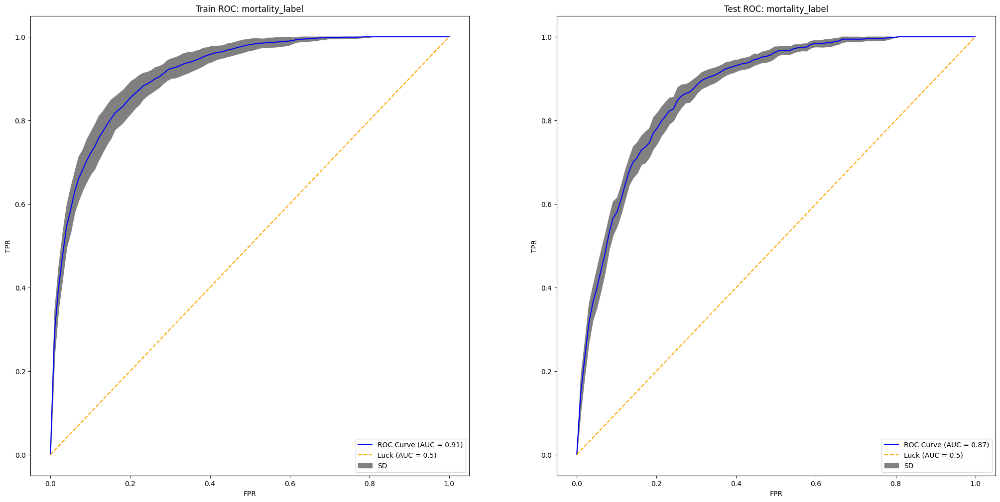

In [ ]:
# @title ROC Curves
fig, axes = plt.subplots(1, 2, figsize=(25, 12))
plot_roc_curve(fitted_mortality_best_model, X_train, y_train[mortality_label], sample_size=y_test.shape[0] // 5, n_samples=20, title=f'Train ROC: {mortality_label}', ax=axes[0])
plot_roc_curve(fitted_mortality_best_model, X_test, y_test[mortality_label], sample_size=y_test.shape[0] // 5, n_samples=20, title=f'Test ROC: {mortality_label}', ax=axes[1])
plt.show()

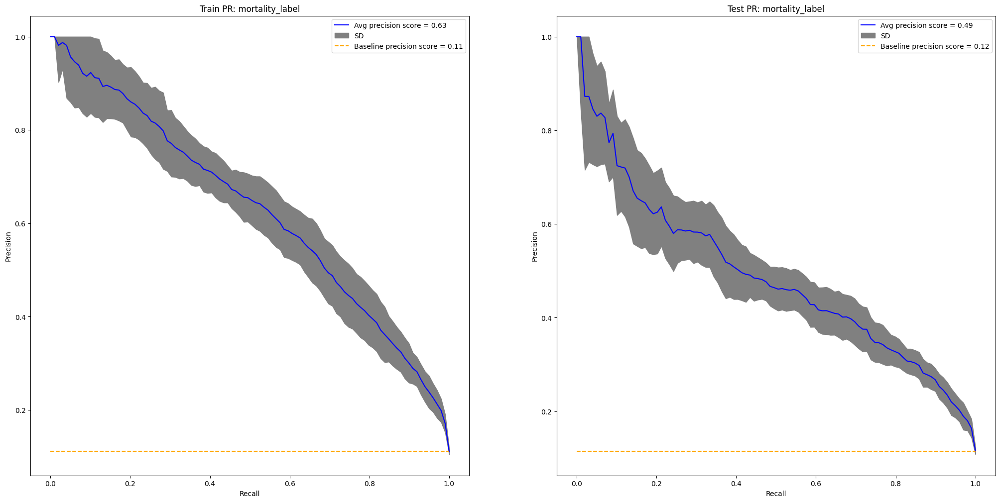

In [ ]:
# @title PR Curves
fig, axes = plt.subplots(1, 2, figsize=(25, 12))
plot_pr_curve(fitted_mortality_best_model, X_train, y_train[mortality_label], sample_size=y_test.shape[0] // 5, n_samples=20, title=f'Train PR: {mortality_label}', ax=axes[0])
plot_pr_curve(fitted_mortality_best_model, X_test, y_test[mortality_label], sample_size=y_test.shape[0] // 5, n_samples=20, title=f'Test PR: {mortality_label}', ax=axes[1])
plt.show()

###Feature Importances

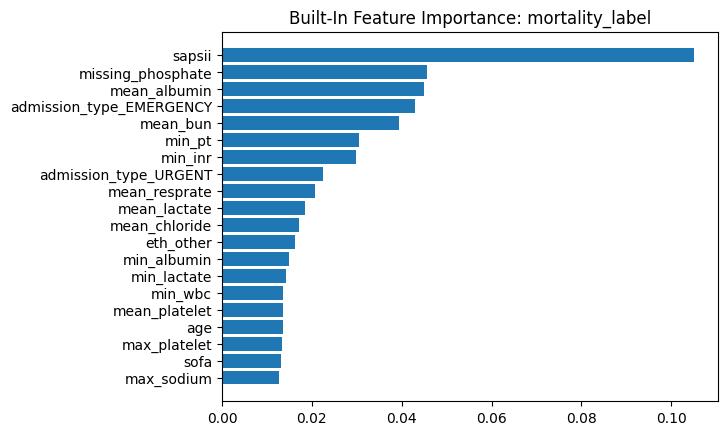

In [ ]:
# @title Built-In
xgb = fitted_mortality_best_model.named_steps['model']
sorted_idx = xgb.feature_importances_.argsort()[-20:]
plt.barh(X_train.columns[sorted_idx], xgb.feature_importances_[sorted_idx])
plt.title(f'Built-In Feature Importance: {mortality_label}')
plt.show()

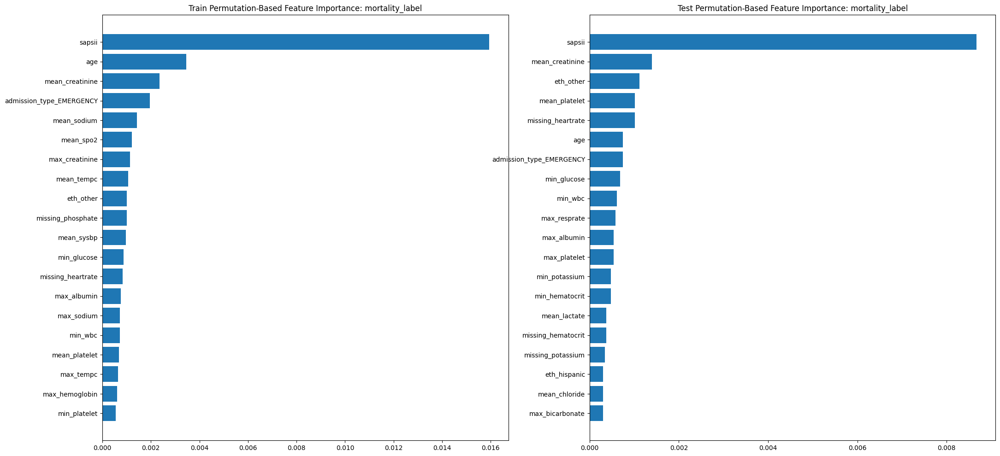

In [ ]:
# @title Permutation-Based
fig, axes = plt.subplots(1, 2, figsize=(25, 12))
perm_importance_train = permutation_importance(fitted_mortality_best_model, X_train, y_train[mortality_label], n_jobs=-1)
sorted_idx_train = perm_importance_train.importances_mean.argsort()[-20:]
axes[0].barh(X_train.columns[sorted_idx_train], perm_importance_train.importances_mean[sorted_idx_train])
axes[0].set_title(f'Train Permutation-Based Feature Importance: {mortality_label}')

perm_importance_test = permutation_importance(fitted_mortality_best_model, X_test, y_test[mortality_label], n_jobs=-1)
sorted_idx_test = perm_importance_test.importances_mean.argsort()[-20:]
axes[1].barh(X_test.columns[sorted_idx_test], perm_importance_test.importances_mean[sorted_idx_test])
axes[1].set_title(f'Test Permutation-Based Feature Importance: {mortality_label}')
plt.show()

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


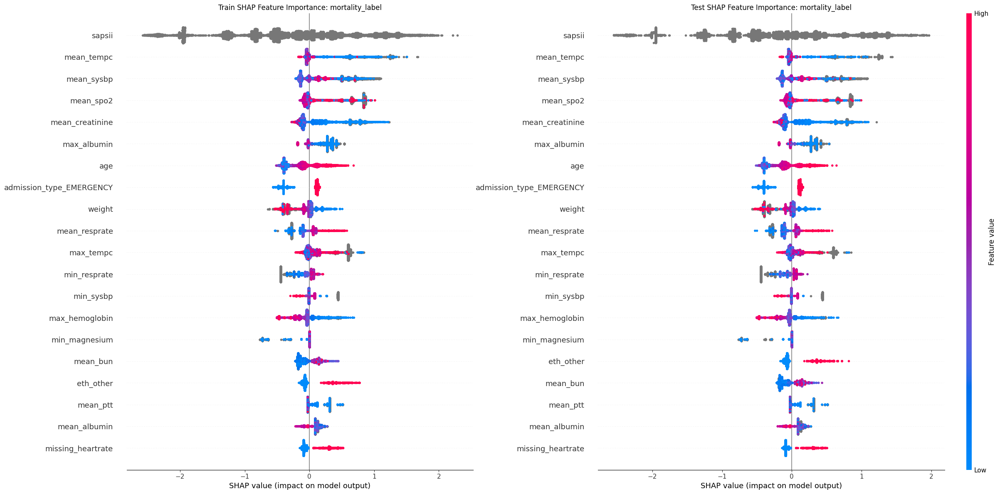

In [ ]:
# @title SHAP
fig, axes = plt.subplots(1, 2, figsize=(25, 12))
fitted_best_model = fitted_mortality_best_model.named_steps['model']
explainer = shap.Explainer(fitted_best_model)
shap_values = explainer.shap_values(X_train)
plt.subplot(1,2,1)
shap.summary_plot(shap_values, X_train, feature_names=X_train.columns, plot_size=None, show=False)
axes[0].set_title(f'Train SHAP Feature Importance: {mortality_label}')

explainer = shap.Explainer(fitted_best_model)
shap_values = explainer.shap_values(X_test)
plt.subplot(1,2,2)
shap.summary_plot(shap_values, X_test, feature_names=X_test.columns, plot_size=None, show=False)
axes[1].set_title(f'Test SHAP Feature Importance: {mortality_label}')
plt.show()

###Calibration

In [ ]:
# @title Calibrate model
calibrated_mortality_best_model = CalibratedClassifierCV(clone(fitted_mortality_best_model), method='sigmoid', n_jobs=-1)
calibrated_mortality_best_model.fit(X_train, y_train[mortality_label]);

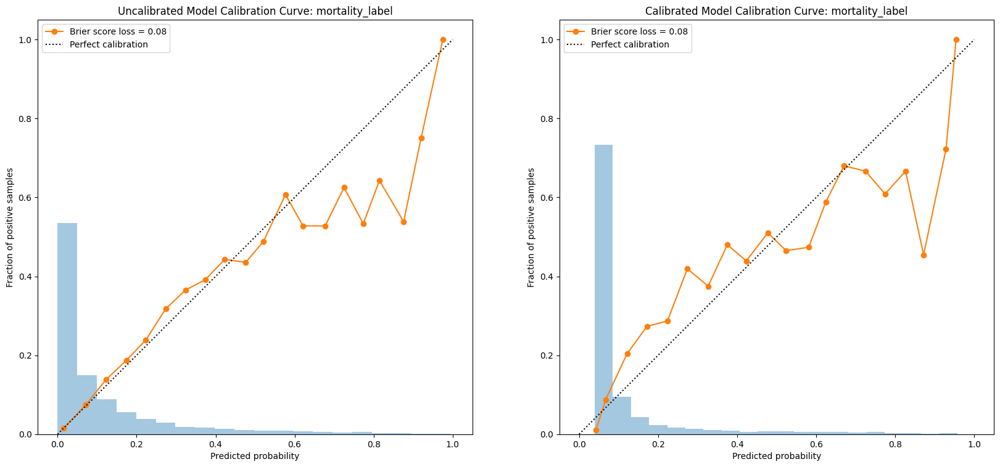

In [ ]:
# @title Calibration Curves
fig, axes = plt.subplots(1, 2, figsize=(20, 12))
plot_calibration_curve(fitted_mortality_best_model, X_test, y_test[mortality_label], n_bins=20, title=f'Uncalibrated Model Calibration Curve: {mortality_label}', ax=axes[0])
plot_calibration_curve(calibrated_mortality_best_model, X_test, y_test[mortality_label], n_bins=20, title=f'Calibrated Model Calibration Curve: {mortality_label}', ax=axes[1])
plt.show()

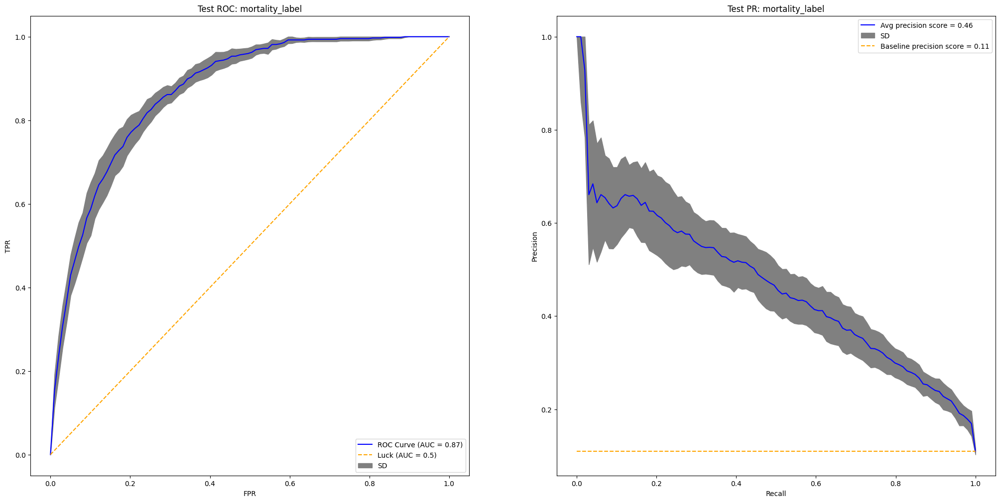

In [ ]:
# @title Calibrated Model's ROC and PR Curves
fig, axes = plt.subplots(1, 2, figsize=(25, 12))
plot_roc_curve(calibrated_mortality_best_model, X_test, y_test[mortality_label], sample_size=y_test.shape[0] // 5, n_samples=20, title=f'Test ROC: {mortality_label}', ax=axes[0])
plot_pr_curve(calibrated_mortality_best_model, X_test, y_test[mortality_label], sample_size=y_test.shape[0] // 5, n_samples=20, title=f'Test PR: {mortality_label}', ax=axes[1])
plt.show()

##Prolonged Stay Target

###ROC and PR Curves

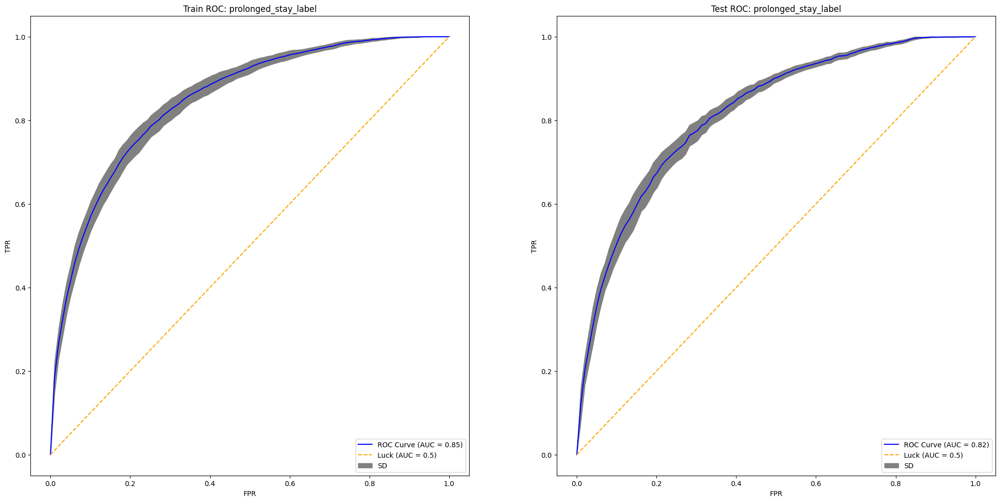

In [ ]:
# @title ROC Curves
fig, axes = plt.subplots(1, 2, figsize=(25, 12))
plot_roc_curve(fitted_prolonged_best_model, X_train_prolonged, y_train[prolonged_label], sample_size=y_test.shape[0] // 5, n_samples=20, title=f'Train ROC: {prolonged_label}', ax=axes[0])
plot_roc_curve(fitted_prolonged_best_model, X_test_prolonged, y_test[prolonged_label], sample_size=y_test.shape[0] // 5, n_samples=20, title=f'Test ROC: {prolonged_label}', ax=axes[1])
plt.show()

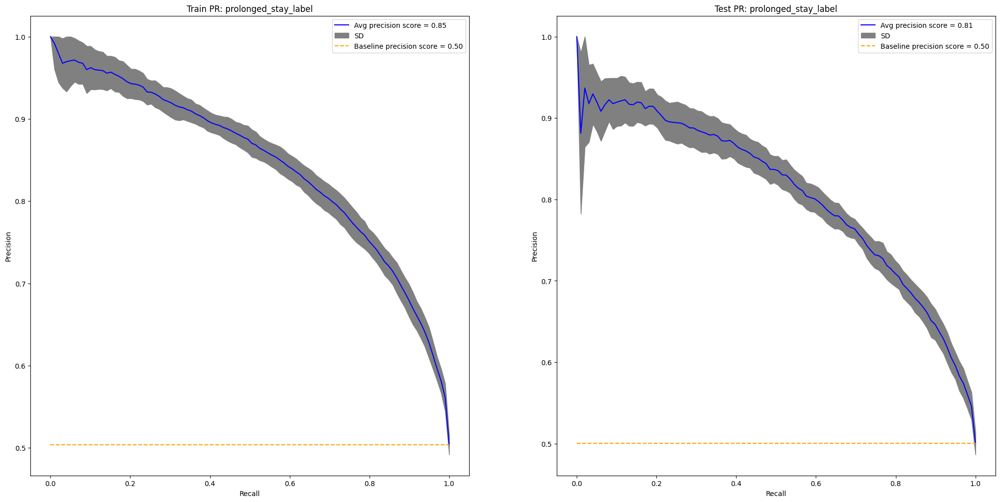

In [ ]:
# @title PR Curves
fig, axes = plt.subplots(1, 2, figsize=(25, 12))
plot_pr_curve(fitted_prolonged_best_model, X_train_prolonged, y_train[prolonged_label], sample_size=y_test.shape[0] // 5, n_samples=20, title=f'Train PR: {prolonged_label}', ax=axes[0])
plot_pr_curve(fitted_prolonged_best_model, X_test_prolonged, y_test[prolonged_label], sample_size=y_test.shape[0] // 5, n_samples=20, title=f'Test PR: {prolonged_label}', ax=axes[1])
plt.show()

###Feature Importances

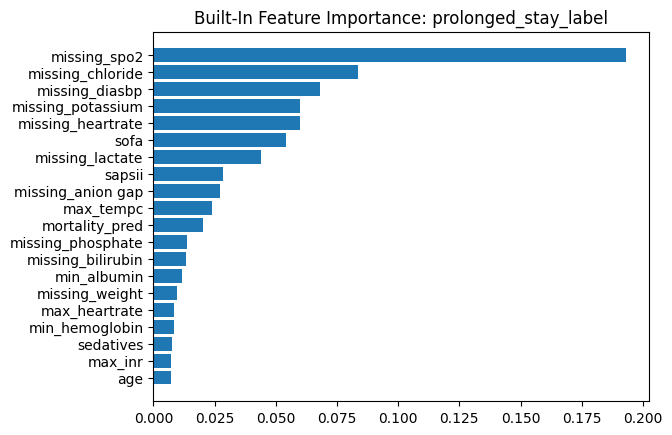

In [ ]:
# @title Built-In
fitted_best_model = fitted_prolonged_best_model.named_steps['model']
sorted_idx = fitted_best_model.feature_importances_.argsort()[-20:]
plt.barh(X_train_prolonged.columns[sorted_idx], fitted_best_model.feature_importances_[sorted_idx])
plt.title(f'Built-In Feature Importance: {prolonged_label}')
plt.show()

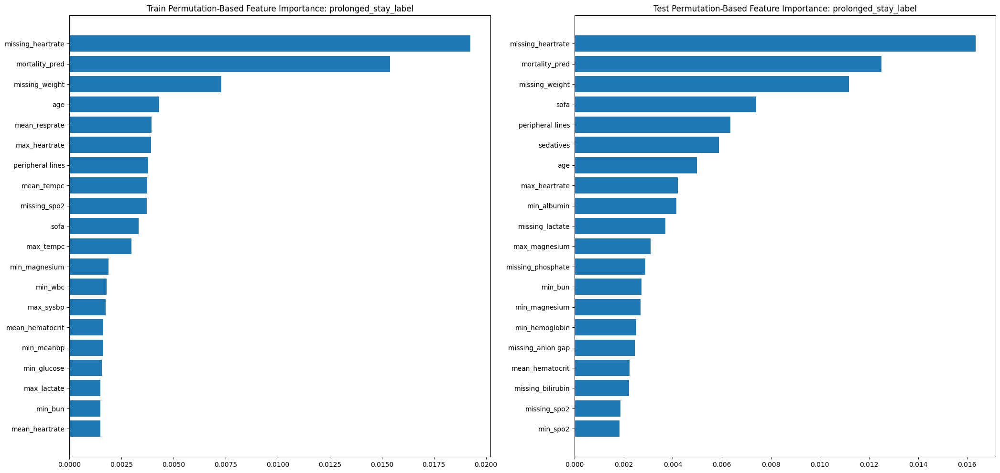

In [ ]:
# @title Permutation-Based
fig, axes = plt.subplots(1, 2, figsize=(25, 12))
perm_importance_train = permutation_importance(fitted_prolonged_best_model, X_train_prolonged, y_train[prolonged_label], n_jobs=-1)
sorted_idx_train = perm_importance_train.importances_mean.argsort()[-20:]
axes[0].barh(X_train_prolonged.columns[sorted_idx_train], perm_importance_train.importances_mean[sorted_idx_train])
axes[0].set_title(f'Train Permutation-Based Feature Importance: {prolonged_label}')

perm_importance_test = permutation_importance(fitted_prolonged_best_model, X_test_prolonged, y_test[prolonged_label], n_jobs=-1)
sorted_idx_test = perm_importance_test.importances_mean.argsort()[-20:]
axes[1].barh(X_test_prolonged.columns[sorted_idx_test], perm_importance_test.importances_mean[sorted_idx_test])
axes[1].set_title(f'Test Permutation-Based Feature Importance: {prolonged_label}')
plt.show()

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


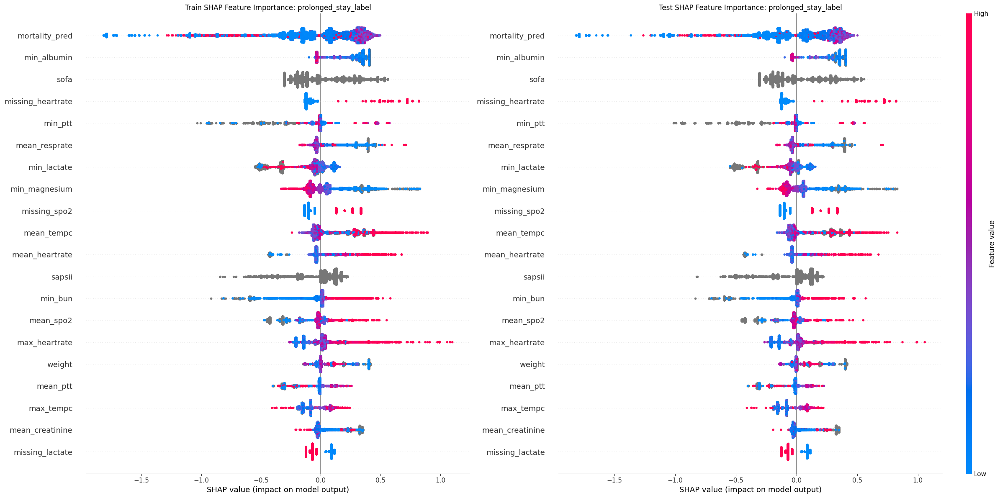

In [ ]:
# @title SHAP
fig, axes = plt.subplots(1, 2, figsize=(25, 12))
fitted_best_model = fitted_prolonged_best_model.named_steps['model']
explainer = shap.Explainer(fitted_best_model)
shap_values = explainer.shap_values(X_train_prolonged)
plt.subplot(1,2,1)
shap.summary_plot(shap_values, X_train_prolonged, feature_names=X_train_prolonged.columns, plot_size=None, show=False)
axes[0].set_title(f'Train SHAP Feature Importance: {prolonged_label}')

explainer = shap.Explainer(fitted_best_model)
shap_values = explainer.shap_values(X_test_prolonged)
plt.subplot(1,2,2)
shap.summary_plot(shap_values, X_test_prolonged, feature_names=X_test_prolonged.columns, plot_size=None, show=False)
axes[1].set_title(f'Test SHAP Feature Importance: {prolonged_label}')
plt.show()

###Calibration

In [ ]:
# @title Calibrate model
X_train_prolonged_calibrated = X_train.copy()
X_train_prolonged_calibrated['mortality_pred'] = calibrated_mortality_best_model.predict_proba(X_train)[:, 1]
X_test_prolonged_calibrated = X_test.copy()
X_test_prolonged_calibrated['mortality_pred'] = calibrated_mortality_best_model.predict_proba(X_test)[:, 1]

calibrated_prolonged_best_model = CalibratedClassifierCV(clone(fitted_prolonged_best_model), method='sigmoid', n_jobs=-1)
calibrated_prolonged_best_model.fit(X_train_prolonged_calibrated, y_train[prolonged_label]);

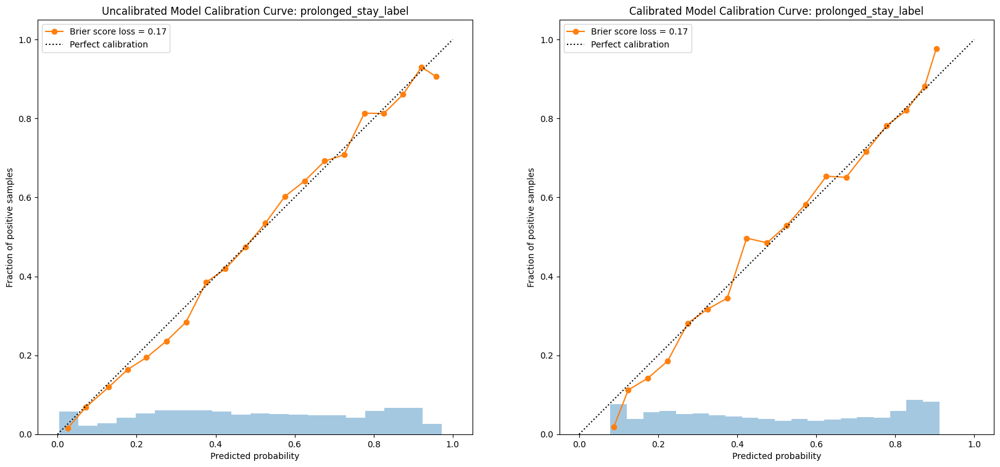

In [ ]:
# @title Calibration Curves
fig, axes = plt.subplots(1, 2, figsize=(20, 12))
plot_calibration_curve(fitted_prolonged_best_model, X_test_prolonged, y_test[prolonged_label], n_bins=20, title=f'Uncalibrated Model Calibration Curve: {prolonged_label}', ax=axes[0])
plot_calibration_curve(calibrated_prolonged_best_model, X_test_prolonged_calibrated, y_test[prolonged_label], n_bins=20, title=f'Calibrated Model Calibration Curve: {prolonged_label}', ax=axes[1])
plt.show()

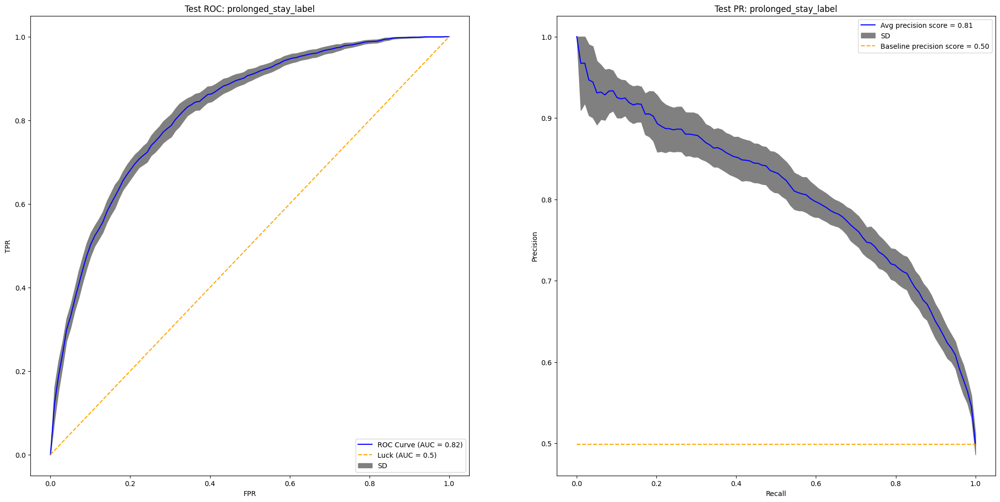

In [ ]:
# @title Calibrated Model's ROC and PR Curves
fig, axes = plt.subplots(1, 2, figsize=(25, 12))
plot_roc_curve(calibrated_prolonged_best_model, X_test_prolonged_calibrated, y_test[prolonged_label], sample_size=y_test.shape[0] // 5, n_samples=20, title=f'Test ROC: {prolonged_label}', ax=axes[0])
plot_pr_curve(calibrated_prolonged_best_model, X_test_prolonged_calibrated, y_test[prolonged_label], sample_size=y_test.shape[0] // 5, n_samples=20, title=f'Test PR: {prolonged_label}', ax=axes[1])
plt.show()

##Readmission Target

###ROC and PR Curves

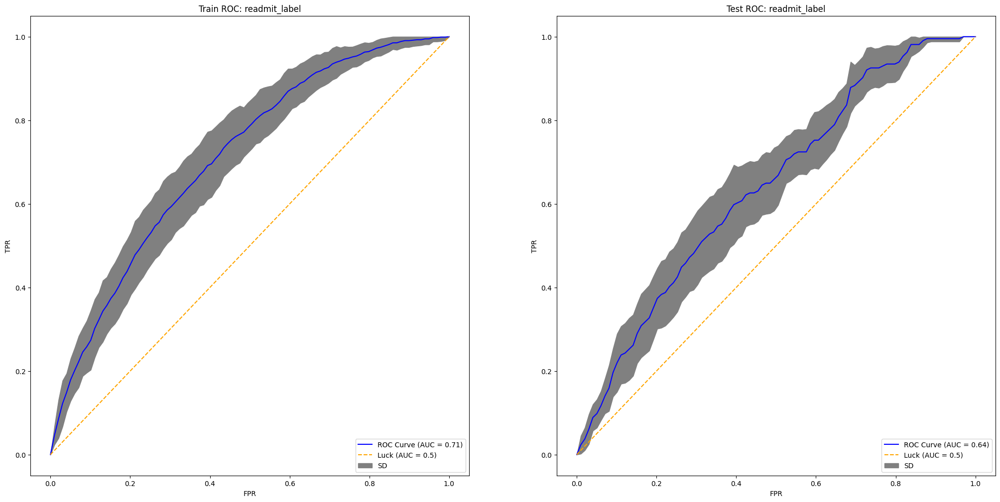

In [ ]:
# @title ROC Curves
fig, axes = plt.subplots(1, 2, figsize=(25, 12))
plot_roc_curve(fitted_readmit_best_model, X_train_readmit, y_train[readmit_label], sample_size=y_test.shape[0] // 5, n_samples=20, title=f'Train ROC: {readmit_label}', ax=axes[0])
plot_roc_curve(fitted_readmit_best_model, X_test_readmit, y_test[readmit_label], sample_size=y_test.shape[0] // 5, n_samples=20, title=f'Test ROC: {readmit_label}', ax=axes[1])
plt.show()

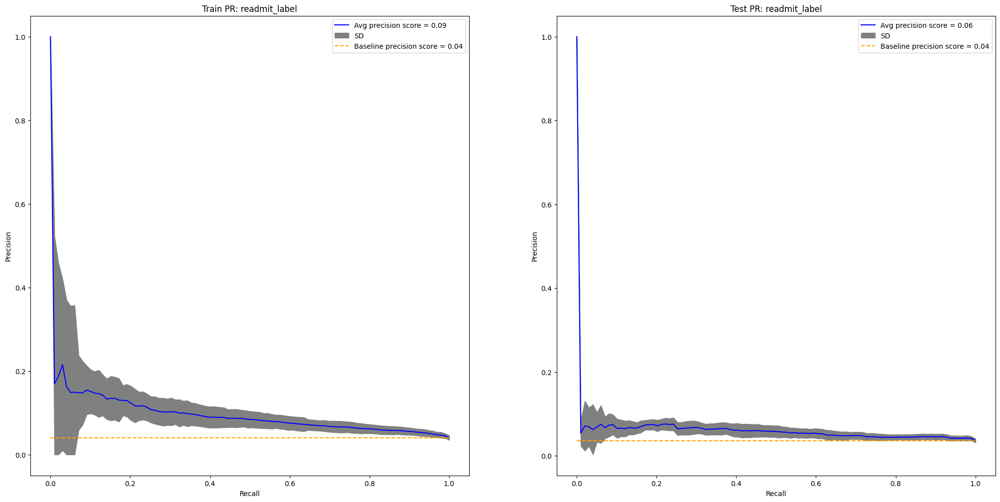

In [ ]:
# @title PR Curves
fig, axes = plt.subplots(1, 2, figsize=(25, 12))
plot_pr_curve(fitted_readmit_best_model, X_train_readmit, y_train[readmit_label], sample_size=y_test.shape[0] // 5, n_samples=20, title=f'Train PR: {readmit_label}', ax=axes[0])
plot_pr_curve(fitted_readmit_best_model, X_test_readmit, y_test[readmit_label], sample_size=y_test.shape[0] // 5, n_samples=20, title=f'Test PR: {readmit_label}', ax=axes[1])
plt.show()

###Feature Importances

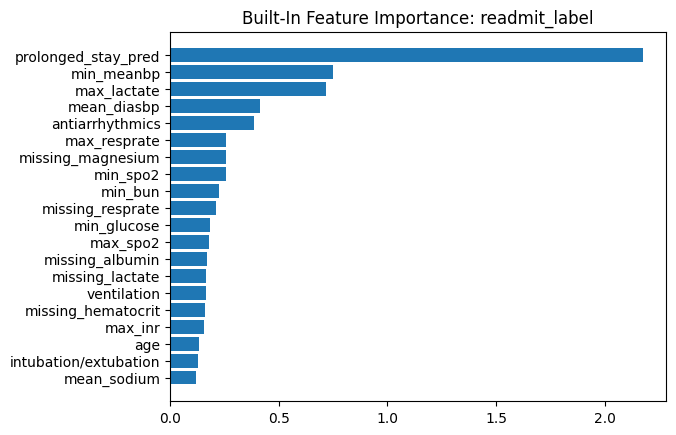

In [ ]:
# @title Built-In
fitted_best_model = fitted_readmit_best_model.named_steps['model']
sorted_idx = fitted_best_model.coef_[0].argsort()[-20:]
plt.barh(X_train_readmit.columns[sorted_idx], fitted_best_model.coef_[0][sorted_idx])
plt.title(f'Built-In Feature Importance: {readmit_label}')
plt.show()

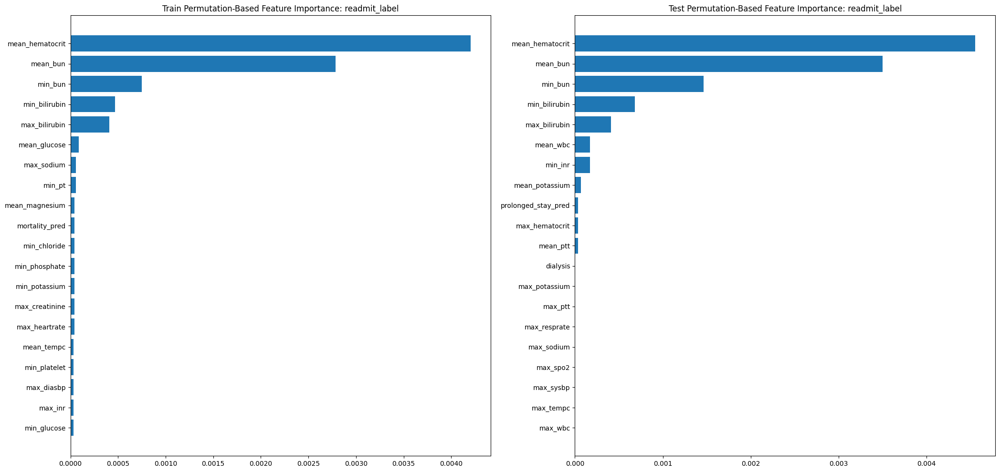

In [ ]:
# @title Permutation-Based
fig, axes = plt.subplots(1, 2, figsize=(25, 12))
perm_importance_train = permutation_importance(fitted_readmit_best_model, X_train_readmit, y_train[readmit_label], n_jobs=-1)
sorted_idx_train = perm_importance_train.importances_mean.argsort()[-20:]
axes[0].barh(X_train_readmit.columns[sorted_idx_train], perm_importance_train.importances_mean[sorted_idx_train])
axes[0].set_title(f'Train Permutation-Based Feature Importance: {readmit_label}')

perm_importance_test = permutation_importance(fitted_readmit_best_model, X_test_readmit, y_test[readmit_label], n_jobs=-1)
sorted_idx_test = perm_importance_test.importances_mean.argsort()[-20:]
axes[1].barh(X_test_readmit.columns[sorted_idx_test], perm_importance_test.importances_mean[sorted_idx_test])
axes[1].set_title(f'Test Permutation-Based Feature Importance: {readmit_label}')
plt.show()

###Calibration

In [ ]:
# @title Calibrate model
# @title Calibrate model
X_train_readmit_calibrated = X_train_prolonged_calibrated.copy()
X_train_readmit_calibrated['prolonged_pred'] = calibrated_prolonged_best_model.predict_proba(X_train_prolonged_calibrated)[:, 1]
X_test_readmit_calibrated = X_test_prolonged_calibrated.copy()
X_test_readmit_calibrated['prolonged_pred'] = calibrated_prolonged_best_model.predict_proba(X_test_prolonged_calibrated)[:, 1]

calibrated_readmit_best_model = CalibratedClassifierCV(clone(fitted_readmit_best_model), method='sigmoid', n_jobs=-1)
calibrated_readmit_best_model.fit(X_train_readmit_calibrated, y_train[readmit_label]);

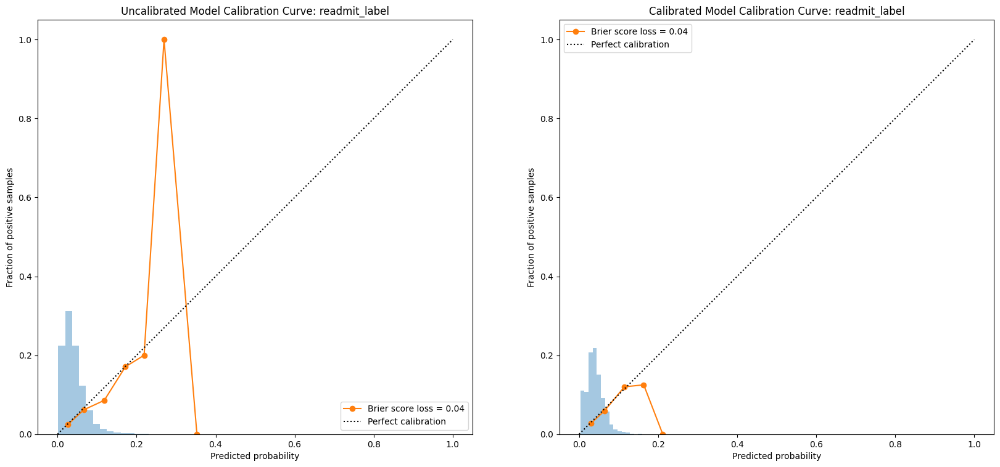

In [ ]:
# @title Calibration Curves
fig, axes = plt.subplots(1, 2, figsize=(20, 12))
plot_calibration_curve(fitted_readmit_best_model, X_test_readmit, y_test[readmit_label], n_bins=20, title=f'Uncalibrated Model Calibration Curve: {readmit_label}', ax=axes[0])
plot_calibration_curve(calibrated_readmit_best_model, X_test_readmit_calibrated, y_test[readmit_label], n_bins=20, title=f'Calibrated Model Calibration Curve: {readmit_label}', ax=axes[1])
plt.show()

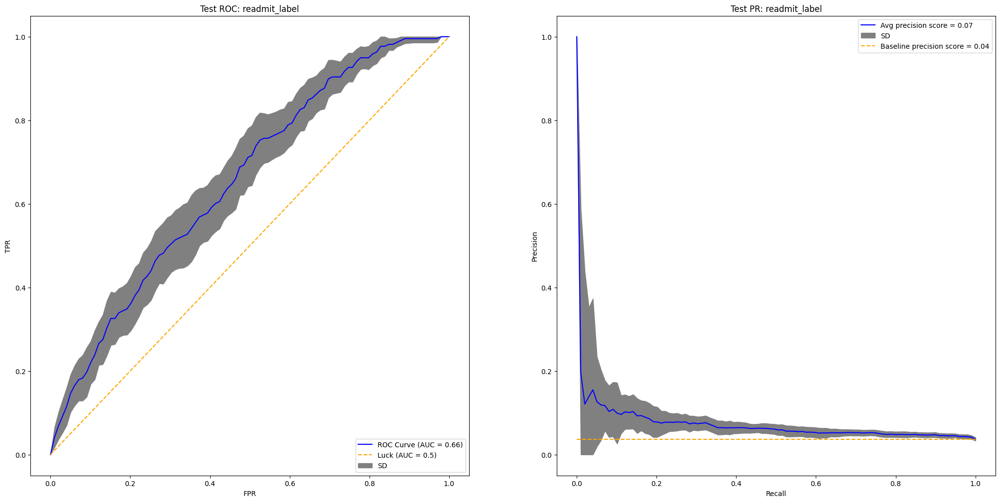

In [ ]:
# @title Calibrated Model's ROC and PR Curves
fig, axes = plt.subplots(1, 2, figsize=(25, 12))
plot_roc_curve(calibrated_readmit_best_model, X_test_readmit_calibrated, y_test[readmit_label], sample_size=y_test.shape[0] // 5, n_samples=20, title=f'Test ROC: {readmit_label}', ax=axes[0])
plot_pr_curve(calibrated_readmit_best_model, X_test_readmit_calibrated, y_test[readmit_label], sample_size=y_test.shape[0] // 5, n_samples=20, title=f'Test PR: {readmit_label}', ax=axes[1])
plt.show()

#Train Final Models

In [ ]:
# @title Mortality Model
mortality_final_model = calibrated_mortality_best_model.fit(X, y[mortality_label])
pickle.dump(mortality_final_model, open('mortality_final_model.pkl', 'wb'))

In [ ]:
# @title Prolonged Stay Model
X_prolonged = X.copy()
X_prolonged['mortality_pred'] = mortality_final_model.predict_proba(X)[:, 1]
prolonged_final_model = calibrated_prolonged_best_model.fit(X_prolonged, y[prolonged_label])
pickle.dump(prolonged_final_model, open('prolonged_final_model.pkl', 'wb'))

In [ ]:
# @title Readmission Model
X_readmit = X_prolonged.copy()
X_readmit['prolonged_stay_pred'] = prolonged_final_model.predict_proba(X_prolonged)[:, 1]
readmit_final_model = calibrated_readmit_best_model.fit(X_readmit, y[readmit_label])
pickle.dump(readmit_final_model, open('readmit_final_model.pkl', 'wb'))